<a href="https://colab.research.google.com/github/akshat2635/auto-eval/blob/main/final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 14.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manyl

In [2]:
# required modules
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os
import shutil
import PIL.Image
from PIL import Image


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:
dir="/content/drive/MyDrive/anand_mishra/Train_Samples_V0"
arr=[]
imgs=[]
for root,dirs,files in os.walk(dir):
    for file in files:
        path=dir+"/"+file
        arr.append(path)
        img=cv2.imread(path)
        # img=cv2.resize(img,(1700,2000))
        img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # plt.imshow(img,cmap='gray')
        print(img.shape)
        # break;
        imgs.append(img)

(8042, 6886)
(7981, 6863)
(8067, 6877)
(7923, 6913)
(7929, 6887)
(8160, 6930)
(7996, 6857)
(7789, 6864)
(7821, 6897)
(7955, 6898)
(7825, 6860)
(8059, 6916)
(7812, 6826)
(8026, 6862)
(7865, 6842)
(7881, 6882)
(7888, 6839)
(7831, 6878)
(8076, 6889)
(8099, 6917)
(7796, 6871)
(7763, 6865)
(7838, 6895)
(7911, 6877)
(7826, 6859)
(7804, 6902)
(7980, 6911)
(7924, 6884)


In [68]:
def preprocess_image(img):

    # Apply thresholding to binarize the image
    if len(img.shape) == 3:  # Check if the image has 3 channels (color image)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, binary_img = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)

    # Apply morphological operations to enhance the text
    kernel = np.ones((3, 3), np.uint8)
    morphed_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel)

    return morphed_img

In [7]:
import easyocr
from pylab import rcParams
from IPython.display import Image

In [8]:
reader = easyocr.Reader(['en'],gpu = True)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [76]:
def get_bound(image1,path):
    image=image1.copy()
    # image=preprocess_image(image)
    res = reader.readtext(path)
    height,width=image.shape[:2]
    bound=width
    cur=1
    texts=[]
    cropped_images = []
    for (bbox, text, prob) in res:
        # cur+=1
    # unpack the bounding box
        (tl, tr, br, bl) = bbox
        tl = (int(tl[0]), int(tl[1]))
        tr = (int(tr[0]), int(tr[1]))
        br = (int(br[0]), int(br[1]))
        bl = (int(bl[0]), int(bl[1]))
        #   print(tl,bound)
        if(cur==1 and ('TRUE' in text)):
            bound=tl[0]-50
            cur=0
            break
    return bound

def crop_image(image,path):
    bound=get_bound(image,path)
    cropped_image=image[:,bound:]
    return cropped_image


In [62]:
def blur_text_regions(image_path):
    # Read the image
    image = cv2.imread(image_path)
    cropped=crop_image(image,image_path)
    image=cropped.copy()
    # Perform OCR to detect text regions
    results = reader.readtext(image)

    # Loop through the detected text regions
    for (bbox, text, prob) in results:
        # Extract the bounding box coordinates
        (top_left, top_right, bottom_right, bottom_left) = bbox
        top_left = tuple(map(int, top_left))
        bottom_right = tuple(map(int, bottom_right))

        # Extract the region of interest (ROI)
        roi = image[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
        roi_height = bottom_right[1] - top_left[1]
        roi_width = bottom_right[0] - top_left[0]
        kernel_size = (max(1, roi_width // 3) | 1, max(1, roi_height // 3) | 1)
        # Apply Gaussian blur to the ROI
        blurred_roi = cv2.GaussianBlur(roi, kernel_size, 0)

        # Replace the original ROI with the blurred ROI
        image[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]] = blurred_roi

    # Save the output image
    # cv2.imwrite(output_path, image)
    # plt.imshow(image)
    # plt.show()
    return image,cropped

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


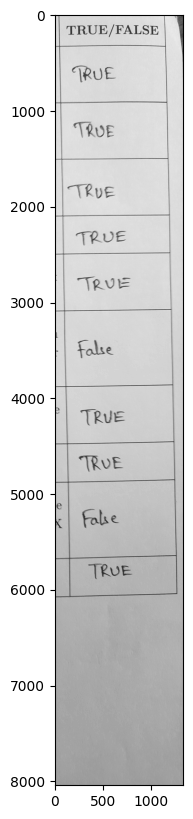

In [15]:
plt.figure(figsize=(10,10))
plt.imshow(crop_image(imgs[0],arr[0]),cmap='gray')

517 638 628 638
748 1018 901 1013
952 1595 1139 1589
1031 2177 1199 2174
750 2569 860 2567
963 3154 1140 3151
939 3938 1247 3927
1134 4522 1230 4519
761 4934 957 4927
1001 5724 1123 5720
944 6122 1093 6116
Detected Lines: [array([[517, 638, 628, 638]], dtype=int32), array([[ 748, 1018,  901, 1013]], dtype=int32), array([[ 952, 1595, 1139, 1589]], dtype=int32), array([[1031, 2177, 1199, 2174]], dtype=int32), array([[ 750, 2569,  860, 2567]], dtype=int32), array([[ 963, 3154, 1140, 3151]], dtype=int32), array([[ 939, 3938, 1247, 3927]], dtype=int32), array([[1134, 4522, 1230, 4519]], dtype=int32), array([[ 761, 4934,  957, 4927]], dtype=int32), array([[1001, 5724, 1123, 5720]], dtype=int32), array([[ 944, 6122, 1093, 6116]], dtype=int32)]


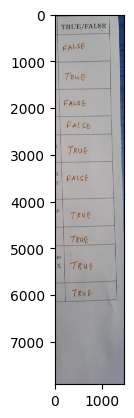

In [72]:
def detect_lines(image_path):
    """
    Detect lines in an image using Hough Line Transform.

    Args:
    - image_path: Path to the input image.

    Returns:
    - image_with_lines: The image annotated with detected lines.
    - lines: The list of detected lines.
    """
    # # Load the image
    # image = cv2.imread(image_path)
    image,org_image = blur_text_regions(image_path);

    # Check if the image is loaded properly
    if image is None:
        raise ValueError(f"Image not found or could not be loaded from {image_path}")

    # Convert the image to grayscale if it's not already
    if len(image.shape) == 3:  # Check if the image has 3 channels (color image)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image  # Image is already grayscale

    # Apply Canny edge detection
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)

    # Detect lines using Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=90, minLineLength=90, maxLineGap=10)

    # Copy the original image to draw lines on it
    image_with_lines = image.copy()

    # Draw the lines on the image
    horizontal_lines = []
    if lines is not None:
        for line in lines:

            x1, y1, x2, y2 = line[0]
            if x1>500:
                    angle = np.arctan2(y2 - y1, x2 - x1) * 180.0 / np.pi
                    # Consider lines with an angle close to 0 or 180 degrees as horizontal
                    if abs(angle) < 60 or abs(angle - 180) < 60:


                            horizontal_lines.append(line)

    horizontal_lines.sort(key=lambda line: line[0][1])

    # Filter out lines that are too close to each other
    filtered_horizontal_lines = []
    for i in range(len(horizontal_lines)):
        if i == 0:
            filtered_horizontal_lines.append(horizontal_lines[i])
        else:
            _, y1_prev, _, y2_prev = horizontal_lines[i - 1][0]
            _, y1_curr, _, y2_curr = horizontal_lines[i][0]
            if abs(y1_curr - y1_prev) >=200 and abs(y2_curr - y2_prev) >= 200:
                filtered_horizontal_lines.append(horizontal_lines[i])
    filtered_horizontal_lines=[i for i in filtered_horizontal_lines if (i[0][1]>100 and i[0][1]<7000)]
    # filtered_horizontal_lines=[i for i in filtered_horizontal_lines if i[0][1]>100]
    # Draw the filtered horizontal lines on the image
    for line in filtered_horizontal_lines:
        x1, y1, x2, y2 = line[0]
        print(x1,y1,x2,y2)
        cv2.line(image_with_lines, (x1, y1), (x2, y2), (0, 255, 0), 3)
    # plt.figure(figsize=(10,10))
    # plt.imshow(image_with_lines)
    # plt.show()

    return org_image, filtered_horizontal_lines



image_with_lines, lines = detect_lines(arr[23])

# Display the image with lines


plt.imshow( image_with_lines)


print(f"Detected Lines: {lines}")

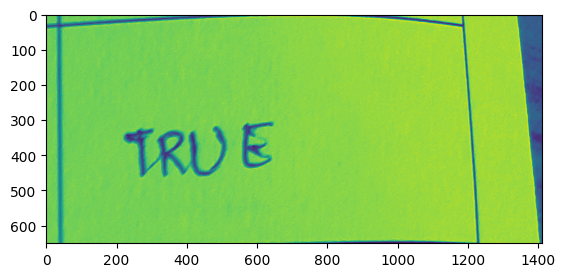

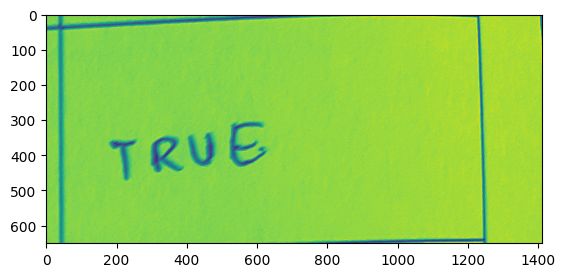

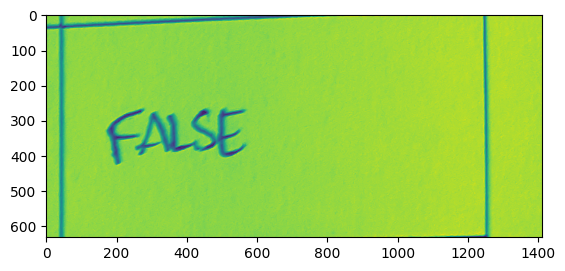

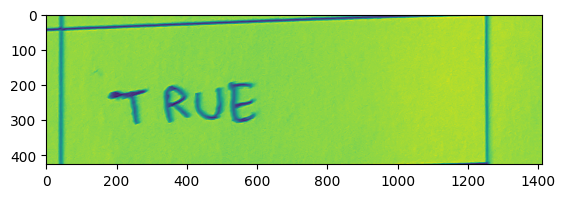

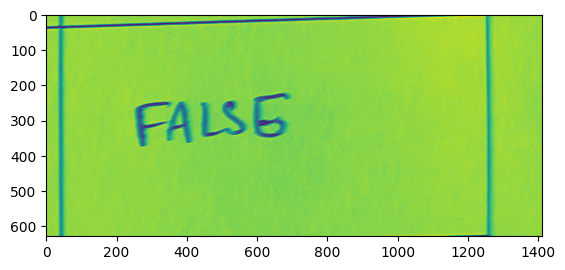

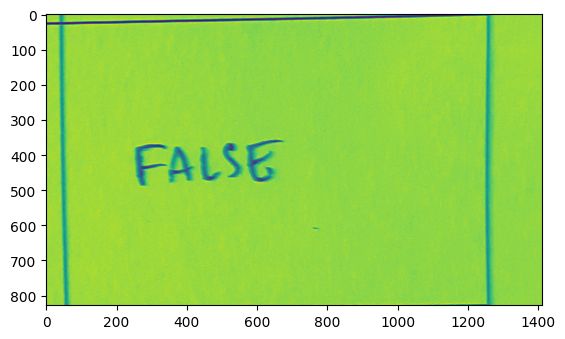

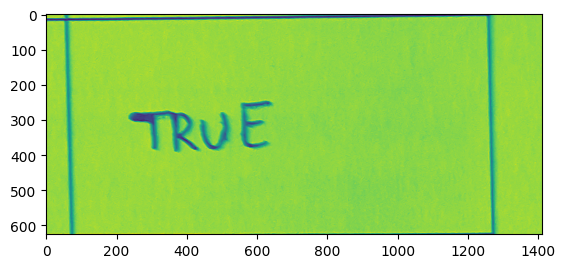

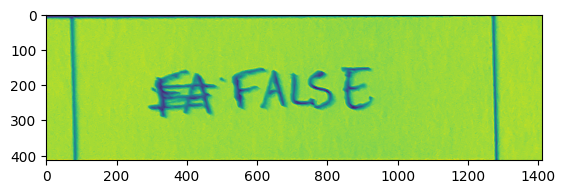

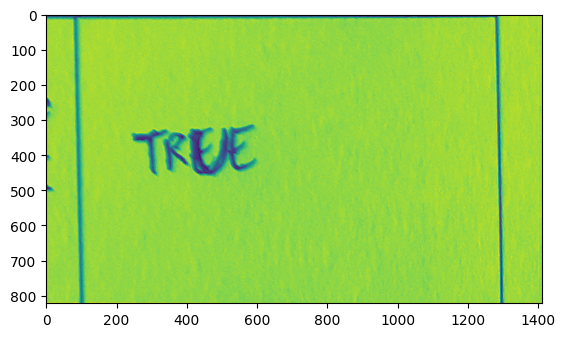

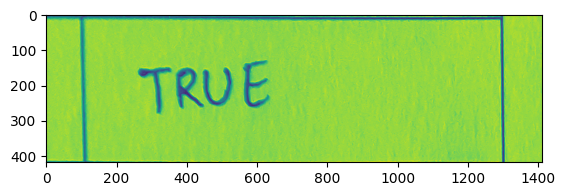

Detected Lines: [array([[868, 338, 987, 344]], dtype=int32), array([[777, 989, 908, 985]], dtype=int32), array([[ 726, 1640,  860, 1635]], dtype=int32), array([[1095, 2272, 1220, 2270]], dtype=int32), array([[1096, 2698, 1251, 2693]], dtype=int32), array([[1132, 3328, 1262, 3324]], dtype=int32), array([[1046, 4156, 1159, 4155]], dtype=int32), array([[ 367, 4782,  586, 4782]], dtype=int32), array([[  59, 5196,  167, 5196]], dtype=int32), array([[ 126, 6018,  220, 6020]], dtype=int32), array([[1108, 6437, 1243, 6437]], dtype=int32)]


In [47]:
def divide_image_into_parts(image, lines):
    """
    Divide the image into 10 parts using the provided lines.

    Args:
    - image: The input image.
    - lines: The list of line coordinates.

    Returns:
    - divided_images: List of 10 image parts.
    """
    lines.sort(key=lambda line: line[0][1])  # Ensure lines are sorted by their y-coordinates

    divided_images = []
    height, width = image.shape[:2]

    # Add the top and bottom boundaries of the image to the lines
    all_y_coords =  [line[0][1] for line in lines]

    # Extract 10 parts of the image based on the y-coordinates
    for i in range(len(all_y_coords) - 1):
        y1 = all_y_coords[i]
        y2 = all_y_coords[i + 1]
        part = image[y1:y2, :]
        divided_images.append(part)

    return divided_images



# # Detect lines and get the annotated image with lines
# image_with_lines, lines = detect_lines()

# Divide the image into 10 parts
divided_images = divide_image_into_parts(crop_image(imgs[1],arr[1]), lines)

# Display the divided parts
for i, part in enumerate(divided_images):
    plt.figure()
    plt.imshow(part)
    # plt.title(f"Part {i+1}")
    plt.show()

print(f"Detected Lines: {lines}")

In [74]:

def get_cropped_images(image_path):
    org_image,lines=detect_lines(image_path)
    org_image=preprocess_image(org_image.copy())
    divided_images=divide_image_into_parts(org_image,lines)
    texts=[]
    for img in divided_images:
        results = reader.readtext(img)
        i=0;
        for bbox,text,score in results:
            i+=1;
            if text[0]=='T' or text[0]=='t':
                texts.append('True')
            elif text[0]=='F' or text[0]=='f':
                texts.append('False')
            else :
                texts.append("nan")
            break
        if(i==0):
            texts.append("nan")
    texts=np.array(texts)
    for i, part in enumerate(divided_images):
        plt.figure()
        plt.imshow(part,cmap='gray')
        plt.title(f"{texts[i]}")
        plt.show()
    return divided_images,texts




/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_152349.jpg
689 315 812 315
698 904 914 904
739 1494 830 1493
701 2090 803 2088
797 2484 934 2482
807 3077 940 3075
920 3863 1100 3860
974 4463 1110 4461
930 4855 1059 4853
903 5649 1050 5644
851 6050 943 6047


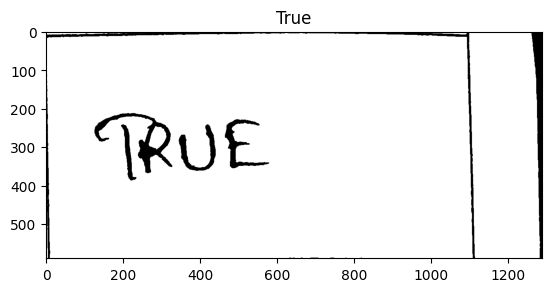

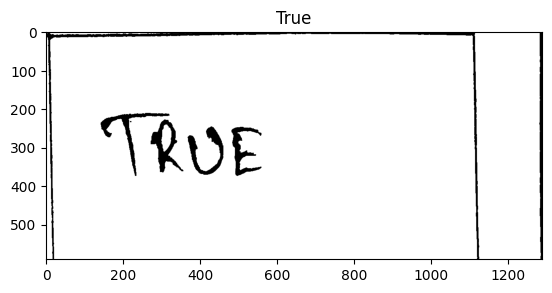

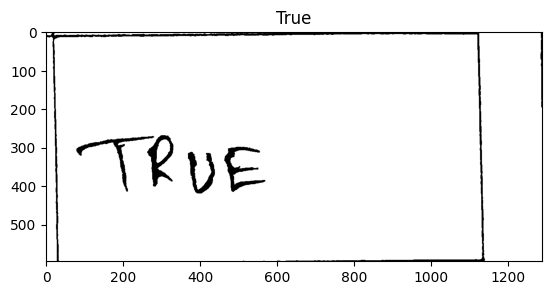

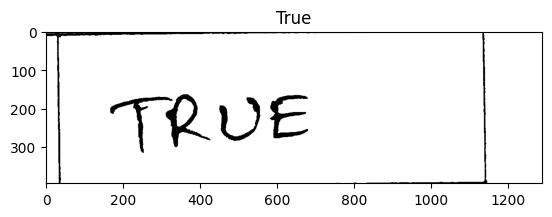

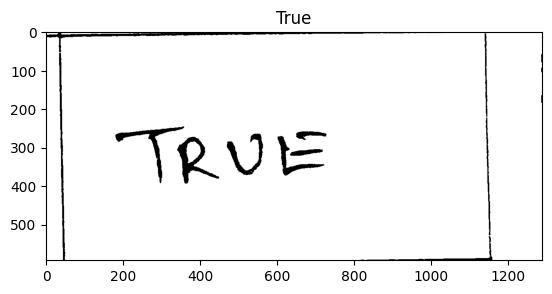

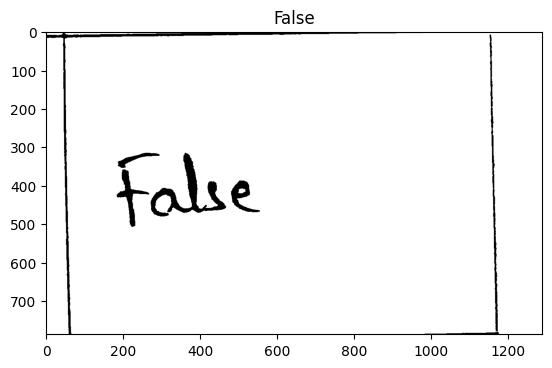

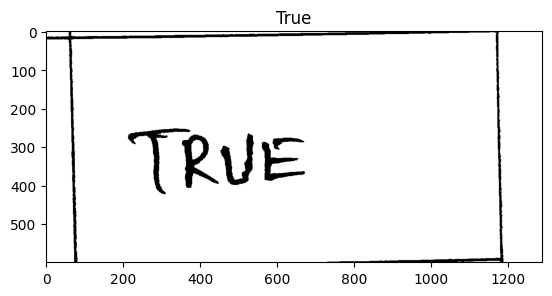

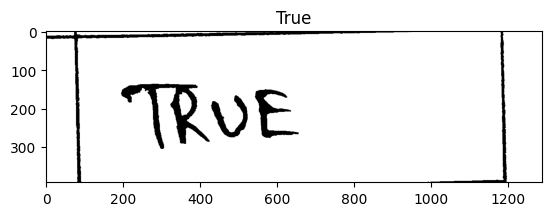

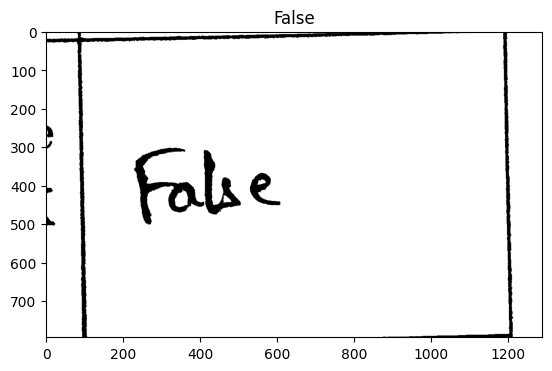

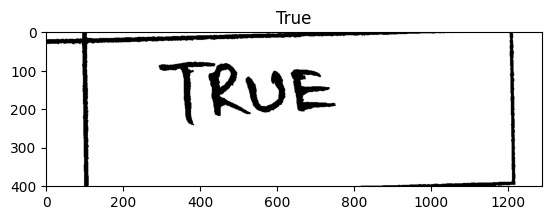

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_155745.jpg
687 341 799 341
1047 994 1143 996
676 1640 781 1637
922 2276 1070 2271
955 2701 1047 2698
1040 3335 1175 3333
989 4156 1107 4154
1049 4786 1153 4786
820 5196 917 5196
544 6024 657 6024
1058 6437 1193 6437


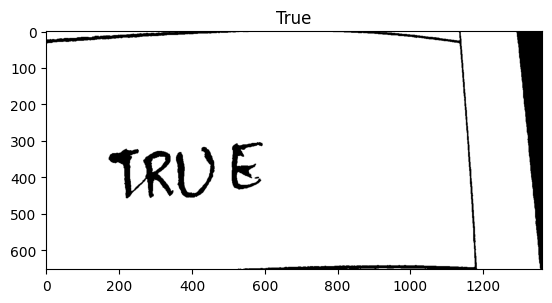

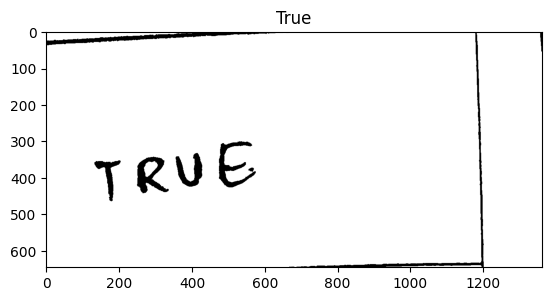

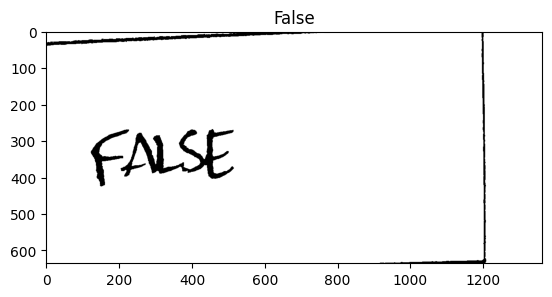

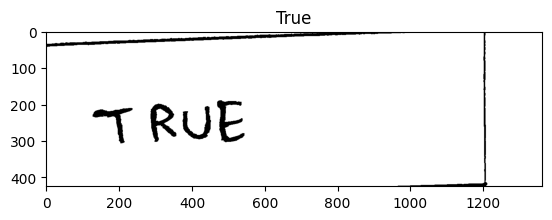

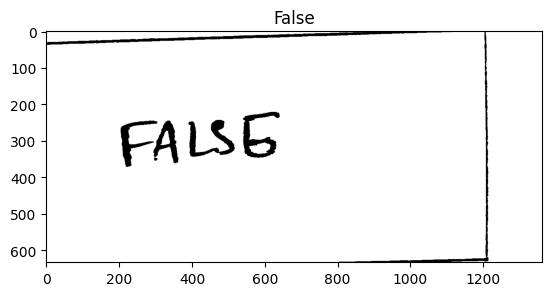

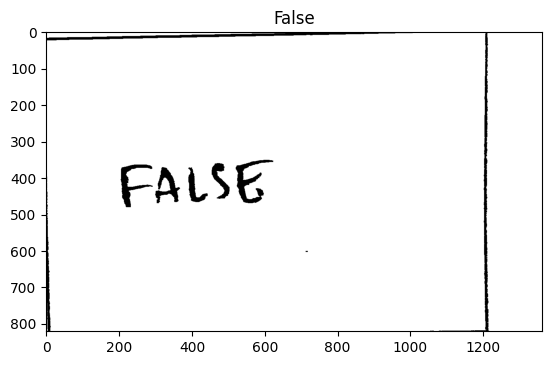

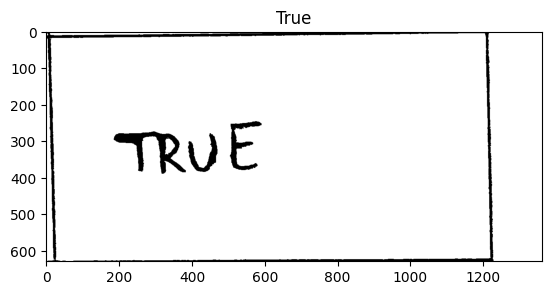

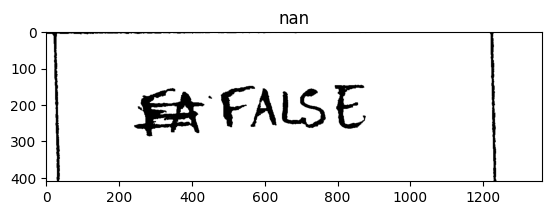

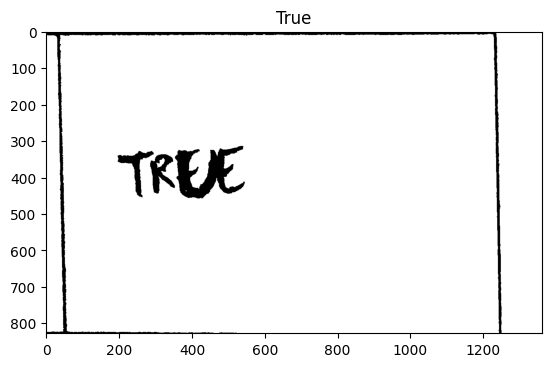

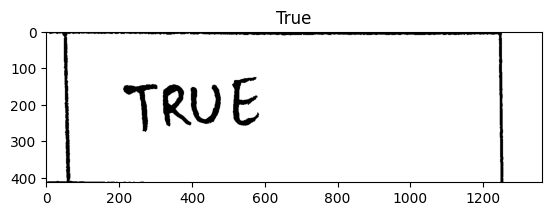

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_150204.jpg
669 385 855 378
776 919 889 917
904 1991 1053 1991
827 2355 927 2354
925 2892 1054 2890
809 3619 938 3617
869 4164 982 4163
912 4529 1005 4528
754 5264 980 5260
946 5629 1106 5626


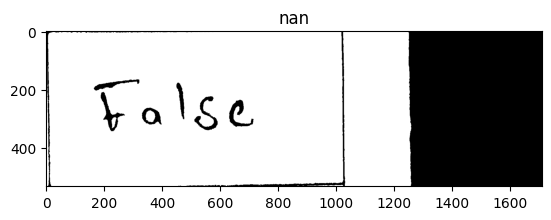

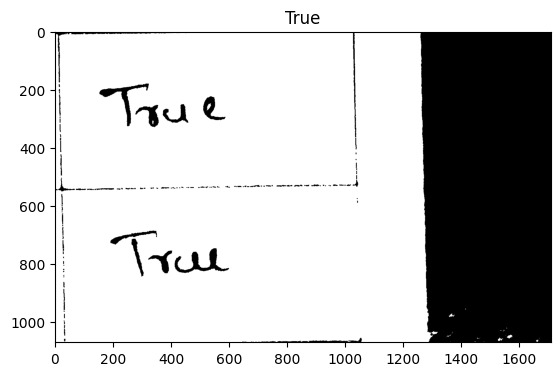

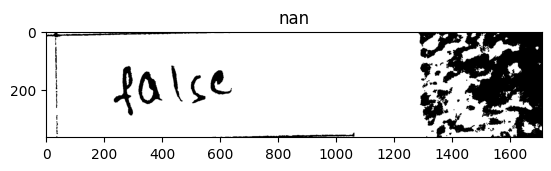

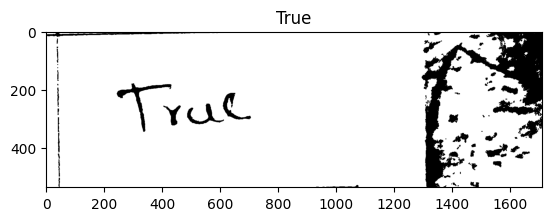

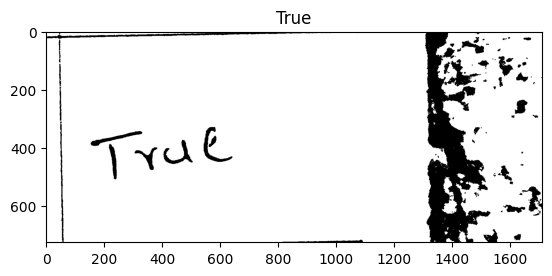

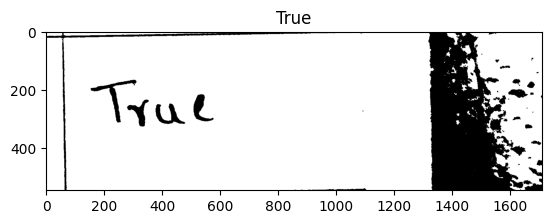

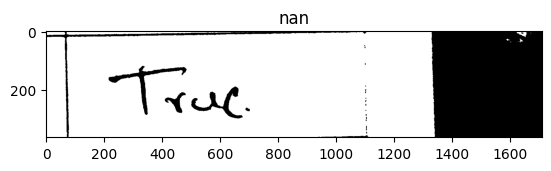

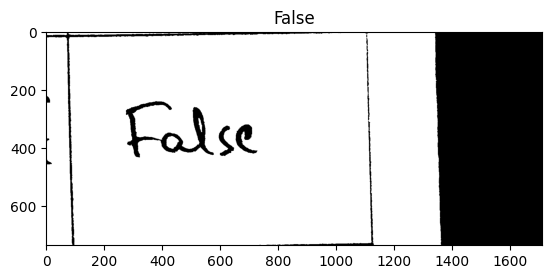

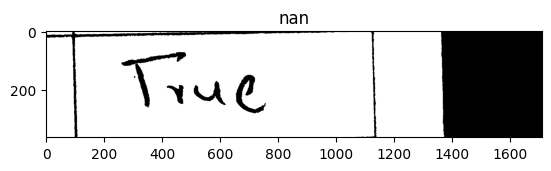

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_145719.jpg
574 414 741 420
908 1033 1068 1036
1029 1630 1129 1630
949 2240 1151 2240
805 2646 904 2646
1046 3259 1163 3257
820 4084 921 4083
1034 4689 1136 4687
859 5106 964 5104
830 5927 1012 5921
825 6338 923 6333


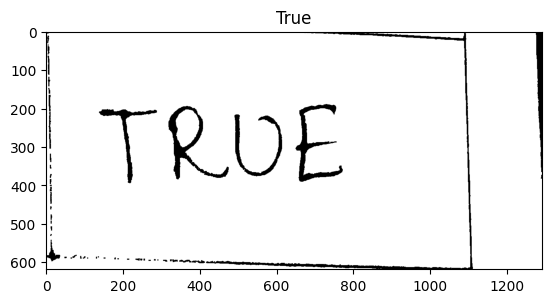

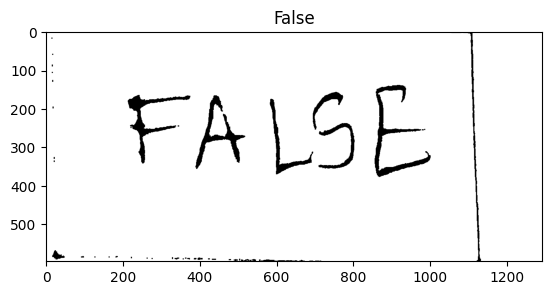

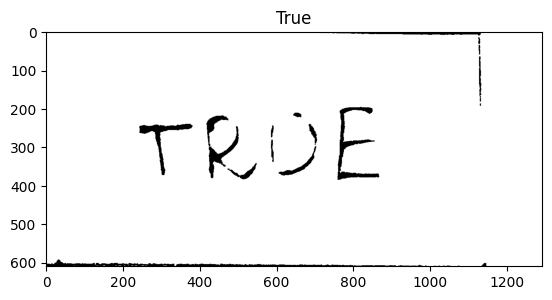

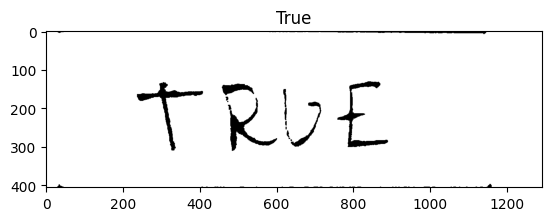

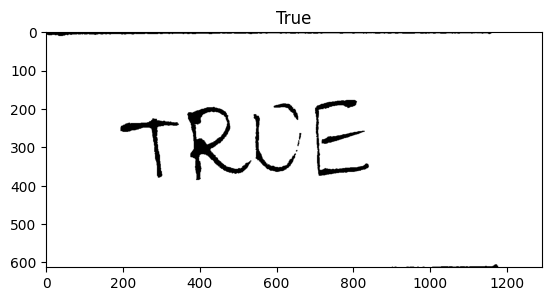

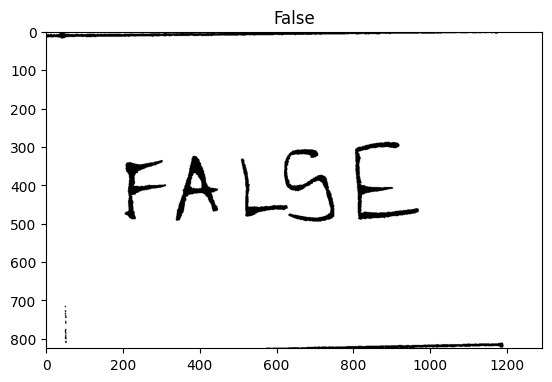

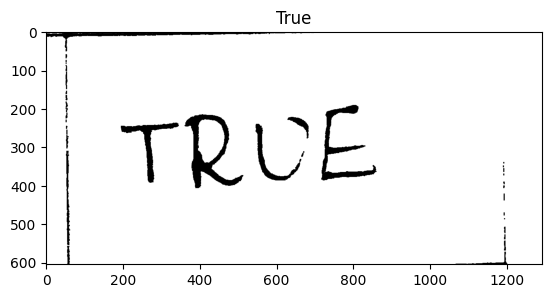

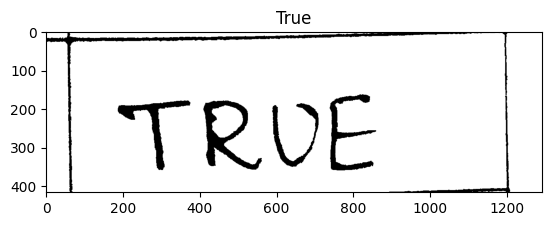

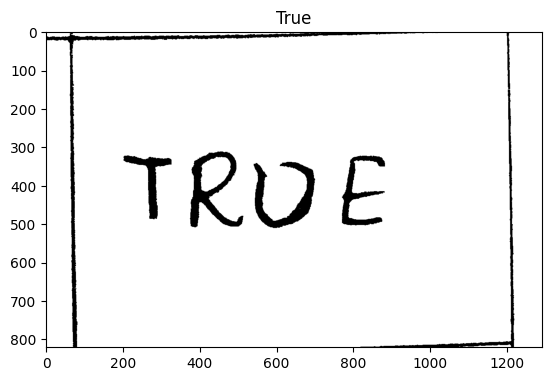

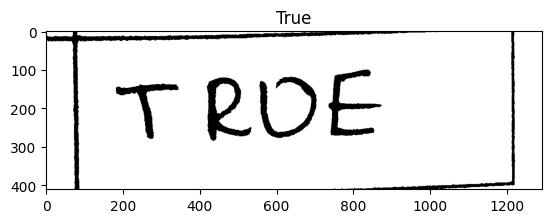

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_153456.jpg
901 366 1029 359
1047 964 1143 959
1055 1572 1148 1571
1012 2164 1138 2164
1014 2564 1132 2564
820 3162 915 3162
980 3955 1072 3953
949 4552 1066 4550
642 4803 766 4794
998 5749 1115 5747
800 6152 891 6151


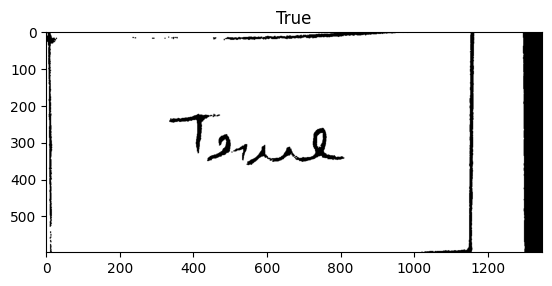

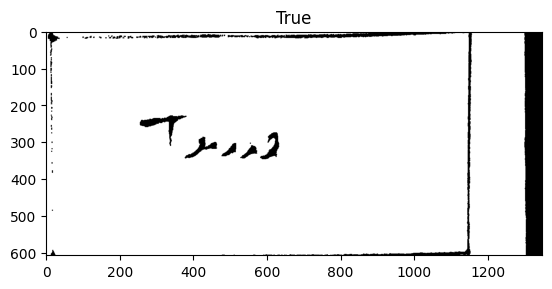

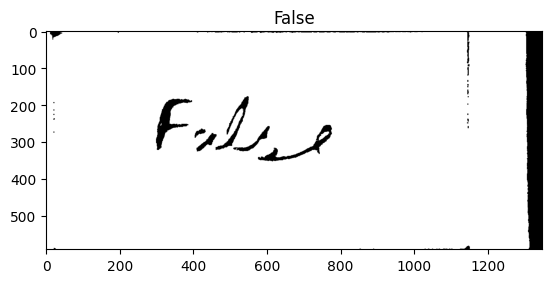

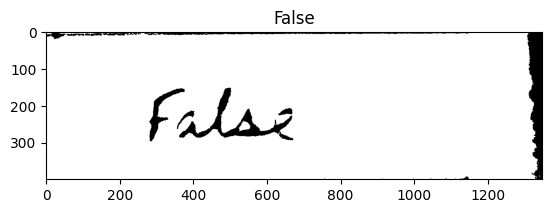

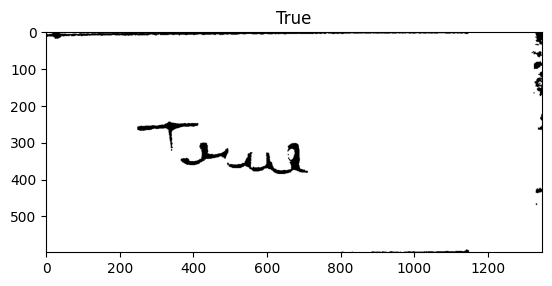

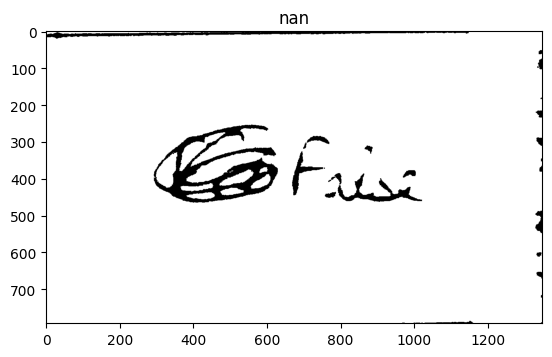

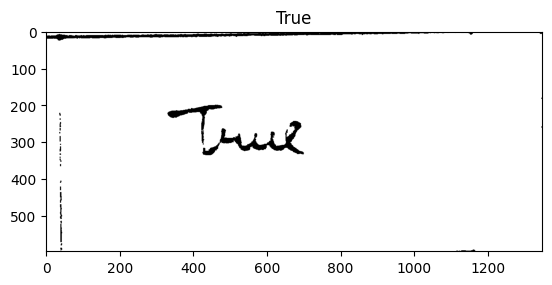

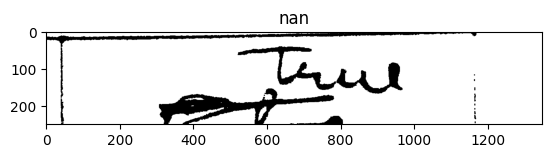

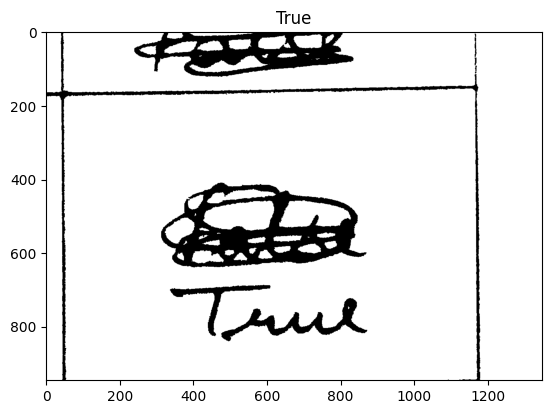

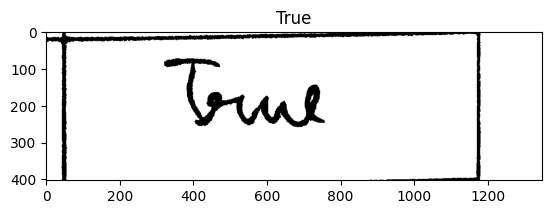

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_145247.jpg
600 304 697 302
759 825 892 823
869 1356 963 1354
882 1897 977 1897
920 2250 1018 2250
717 2792 821 2792
841 3521 1025 3521
735 4067 825 4067
936 4435 1095 4435
729 5182 833 5181
913 5547 1012 5547


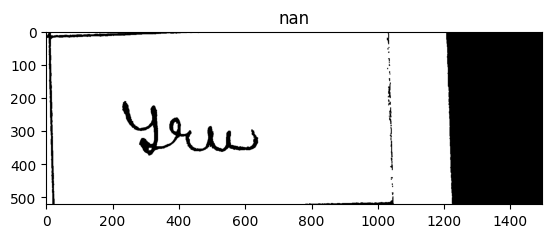

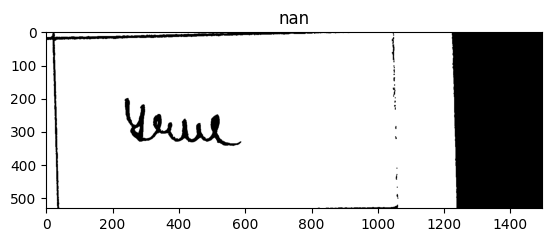

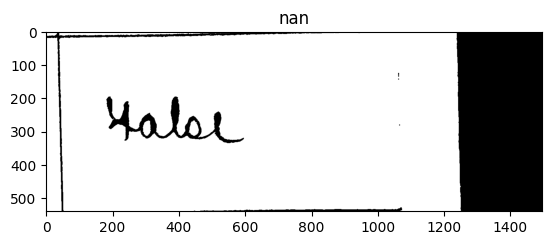

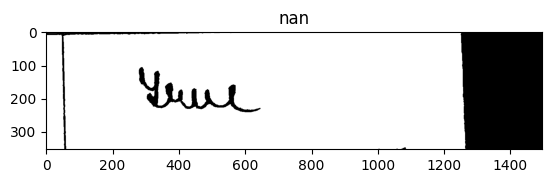

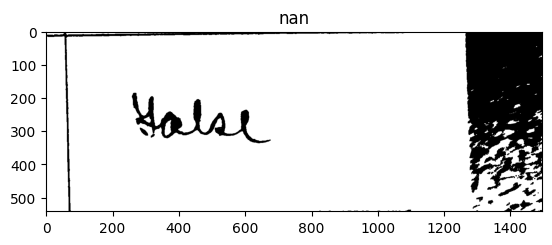

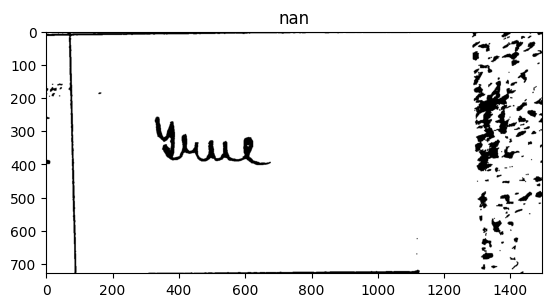

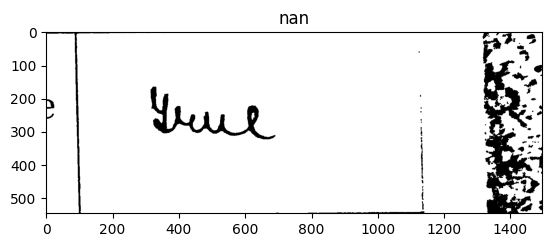

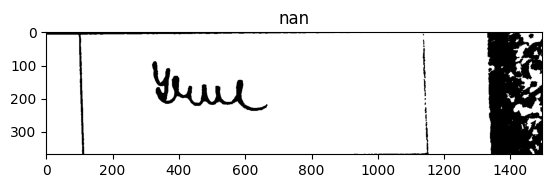

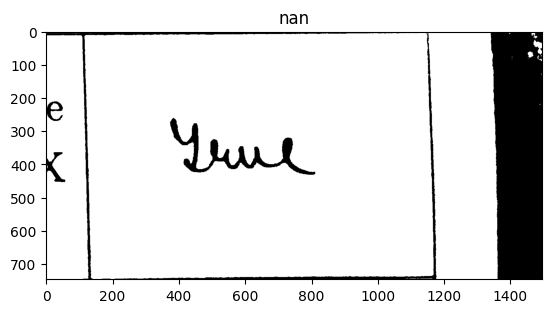

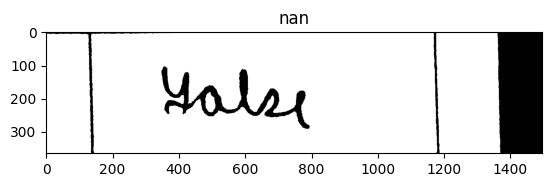

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_154830.jpg
890 421 1046 416
901 1031 993 1029
1020 1642 1118 1641
902 2256 1020 2256
767 2668 861 2668
859 3274 965 3272
622 4072 743 4070
913 4662 1004 4661
712 5071 857 5069
963 5849 1060 5848
816 6255 912 6253


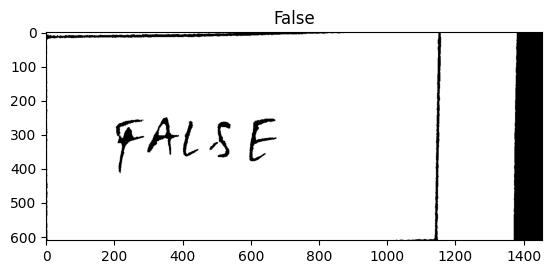

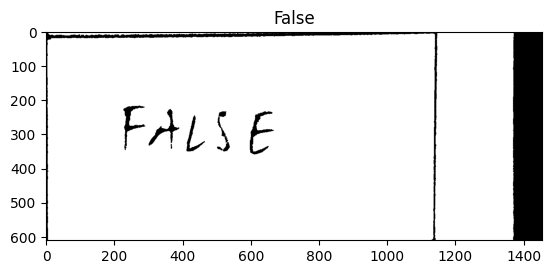

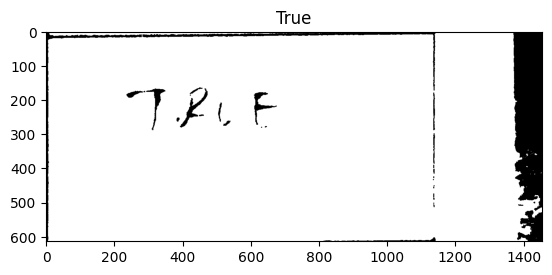

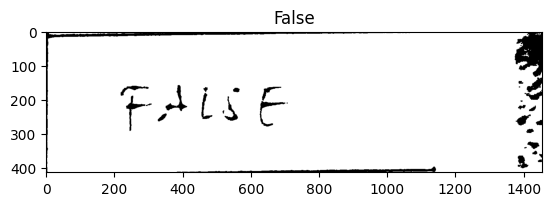

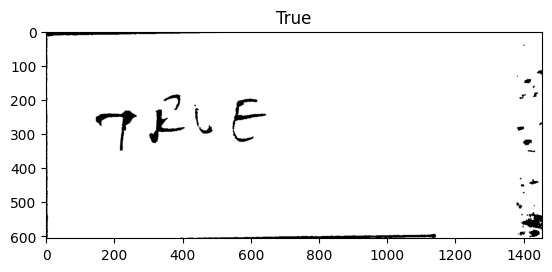

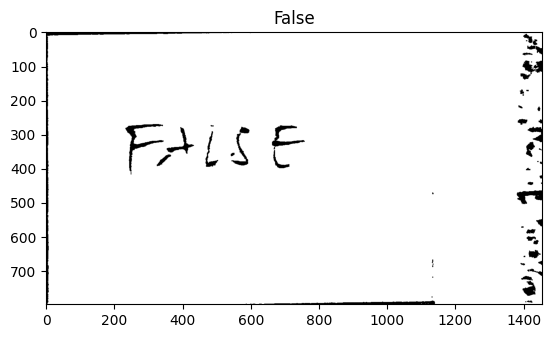

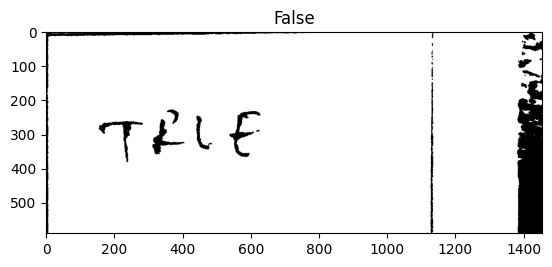

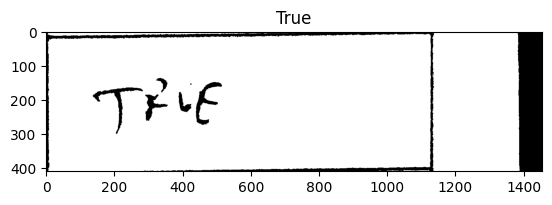

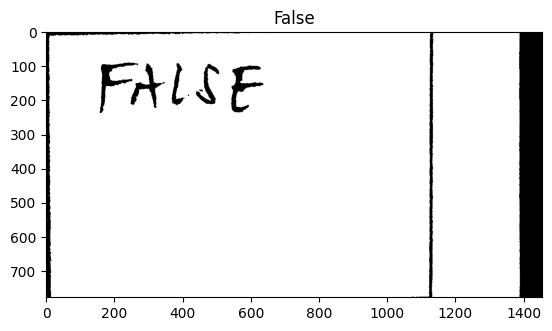

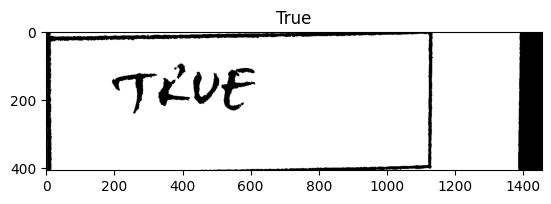

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_153543.jpg
691 325 825 325
689 1554 816 1550
522 2162 624 2160
934 2552 1048 2550
587 3159 987 3153
882 3933 1059 3930
800 4521 897 4519
856 4919 953 4918
805 5698 906 5697
939 6091 1099 6088


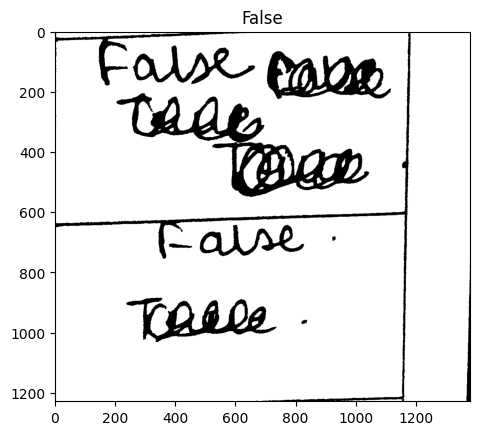

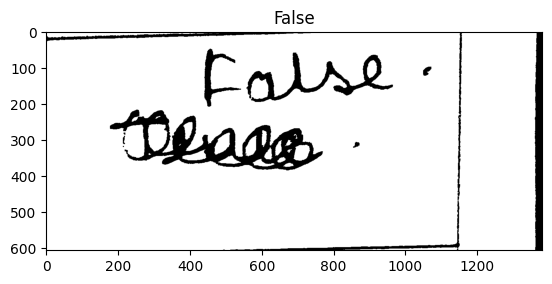

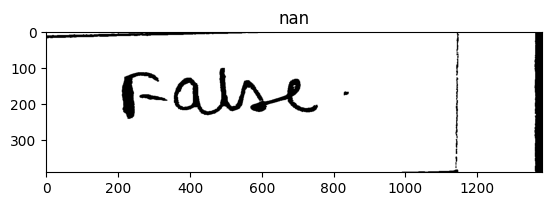

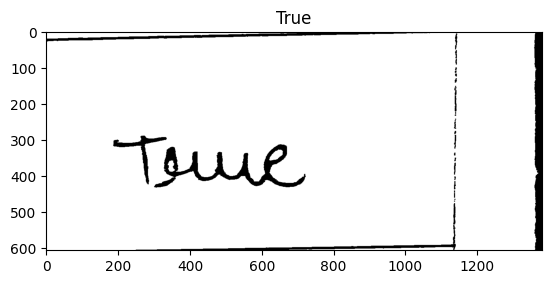

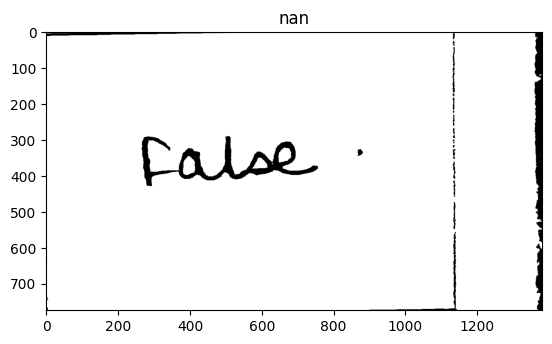

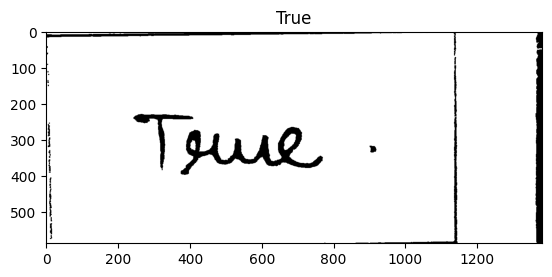

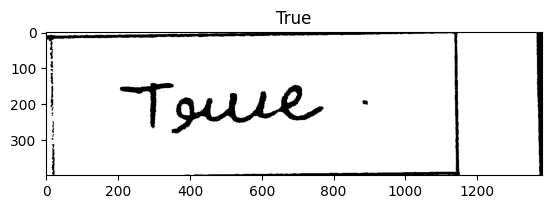

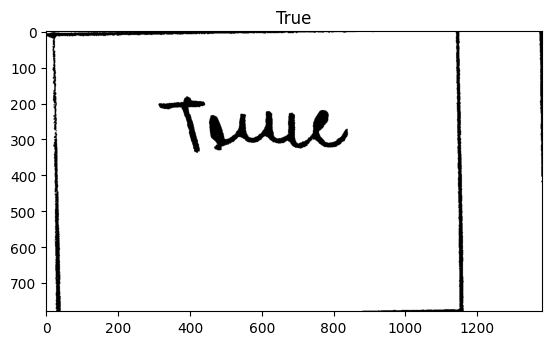

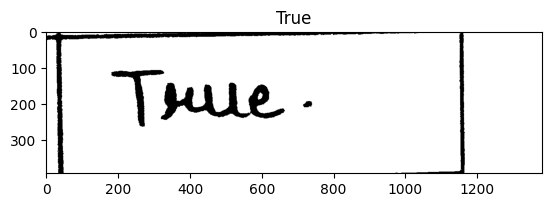

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_150931.jpg
903 879 993 874
658 2429 782 2427
808 2995 911 2992
1089 3754 1179 3753
1111 4333 1204 4330
645 4732 741 4730
922 5508 1101 5502
1093 5890 1224 5885


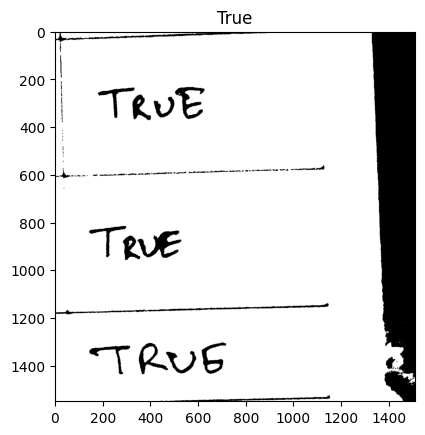

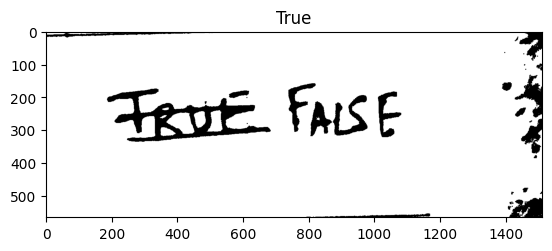

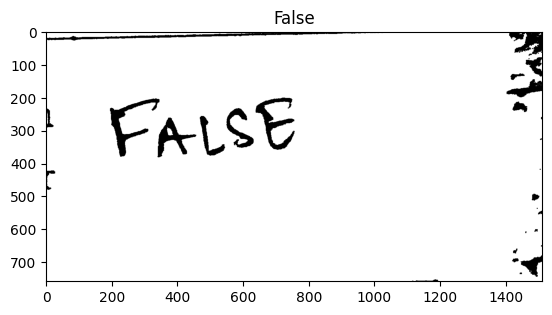

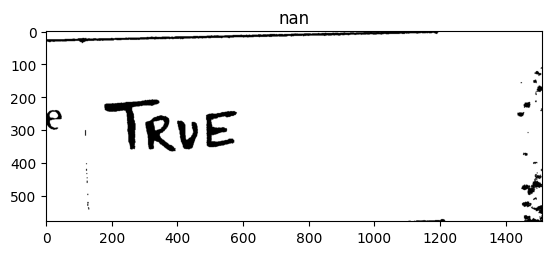

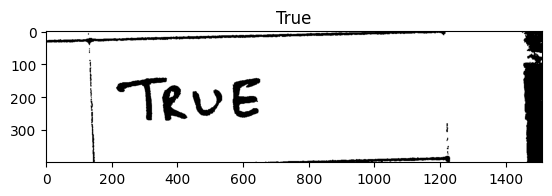

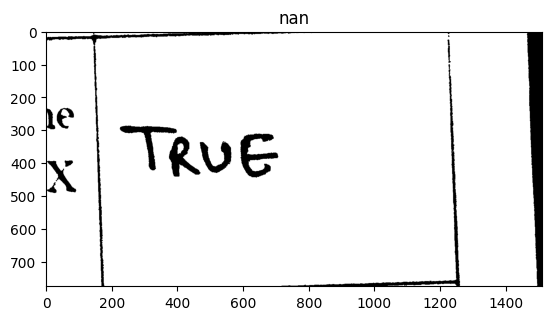

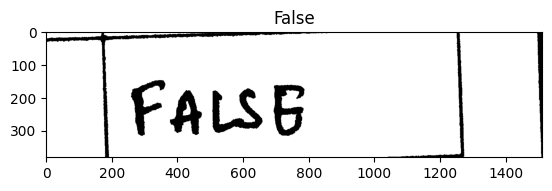

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_151020.jpg
991 363 1087 360
908 1010 1126 1002
807 1645 964 1643
926 2264 1116 2261
942 2675 1114 2672
648 3286 781 3284
551 4093 675 4091
508 4695 607 4695
882 5099 1003 5097
821 5914 1099 5910
1050 6309 1153 6307


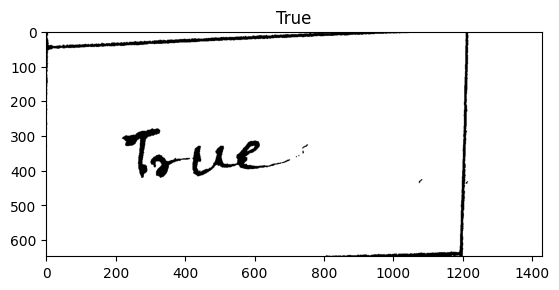

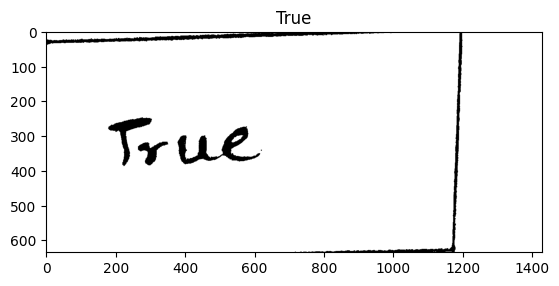

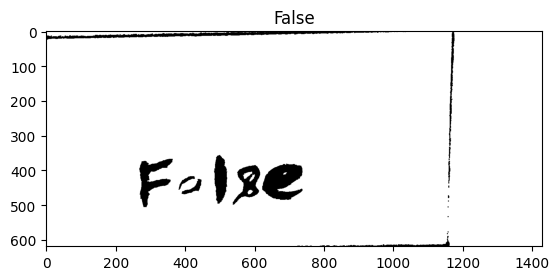

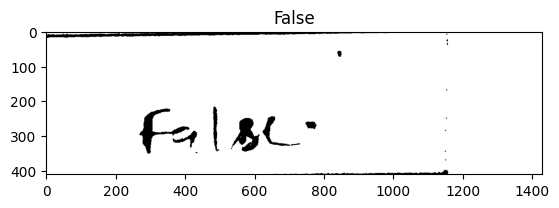

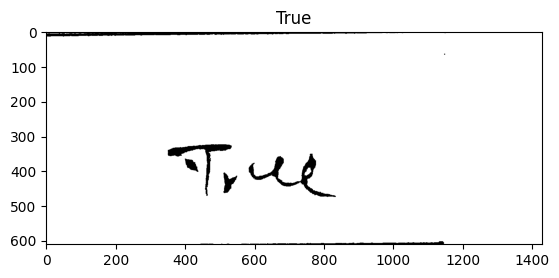

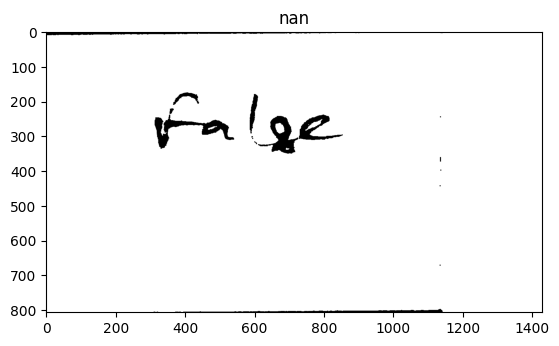

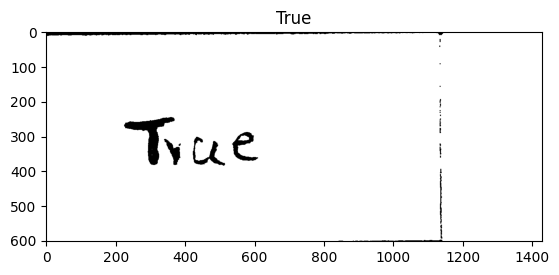

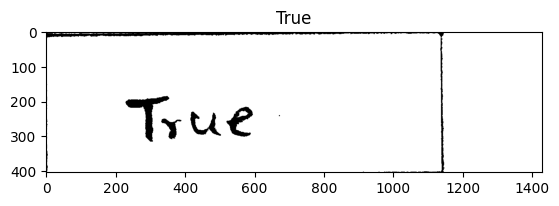

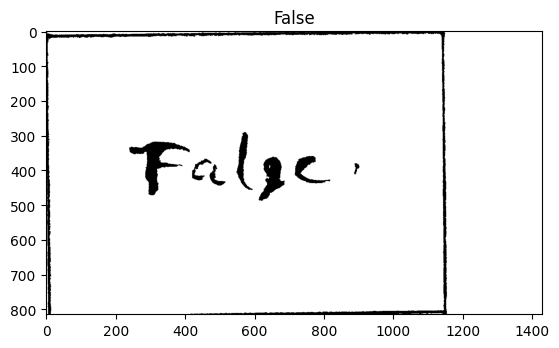

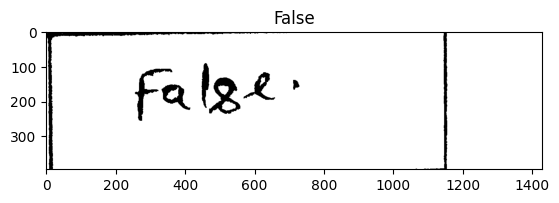

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_154601.jpg
975 337 1106 330
954 918 1071 912
975 1493 1098 1489
852 2067 1010 2064
849 2444 960 2443
828 3007 954 3007
928 3752 1078 3752
746 4318 955 4318
724 4688 850 4686
898 5425 1005 5423
927 5799 1073 5796


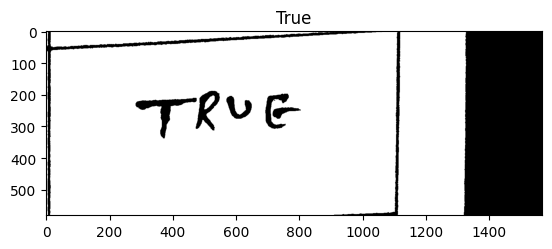

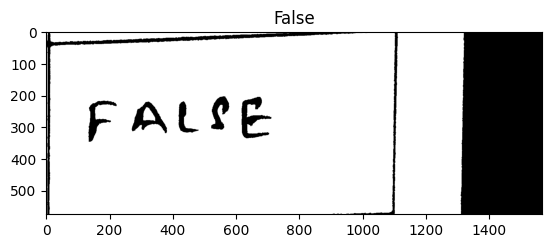

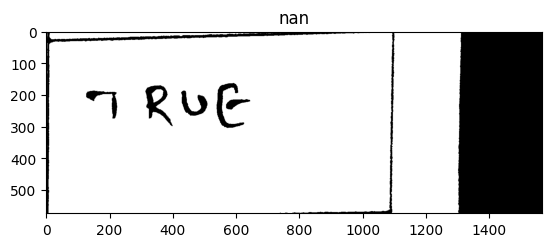

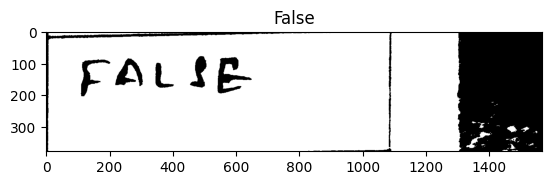

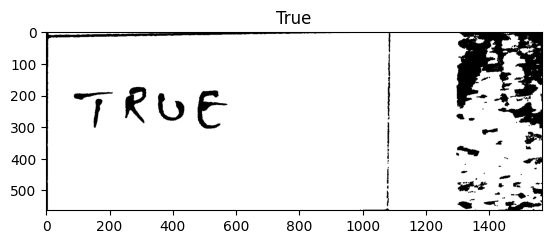

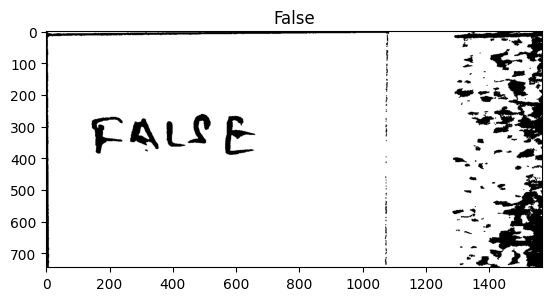

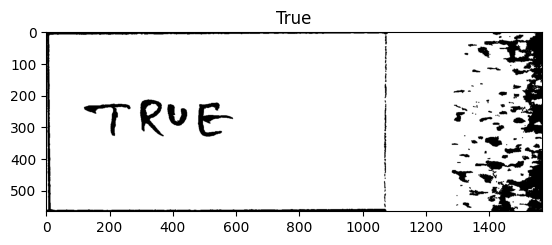

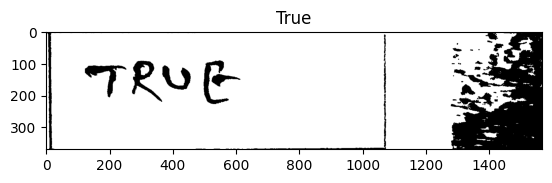

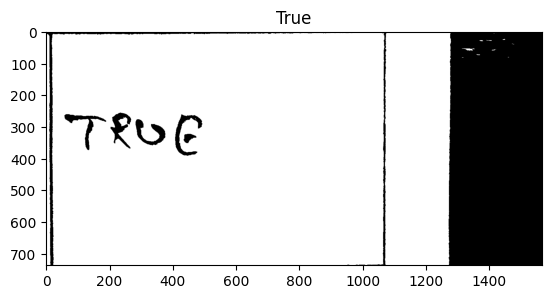

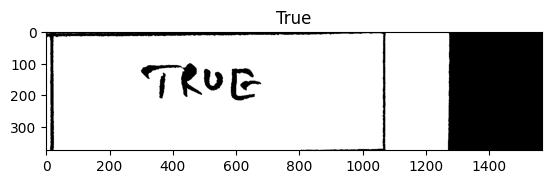

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_151033.jpg
976 372 1104 372
536 967 635 967
724 1558 826 1558
795 2158 888 2158
602 2539 773 2539
879 3127 1017 3127
914 3913 1047 3913
634 4489 735 4489
882 4881 1014 4881
862 5658 955 5658
788 6047 965 6047


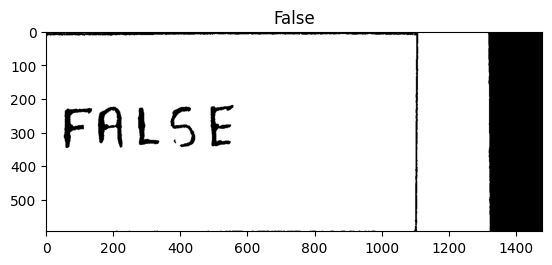

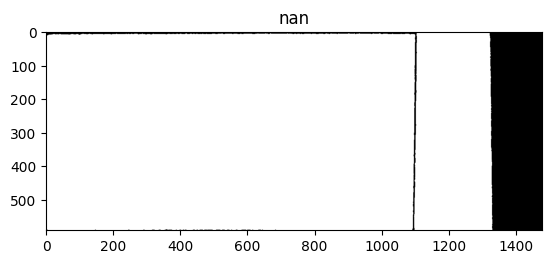

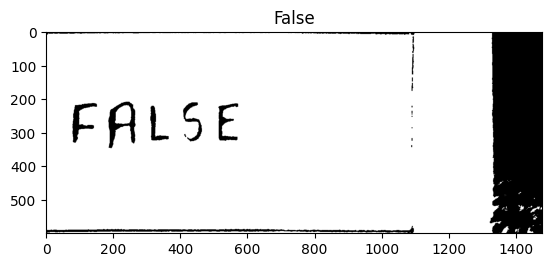

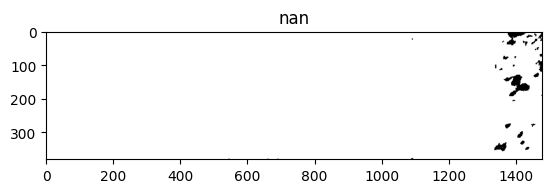

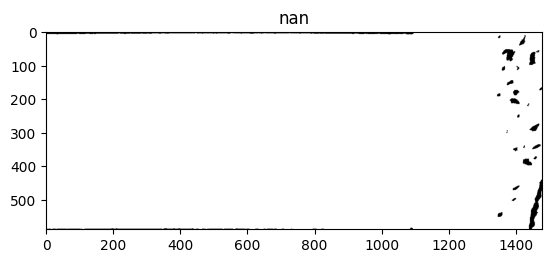

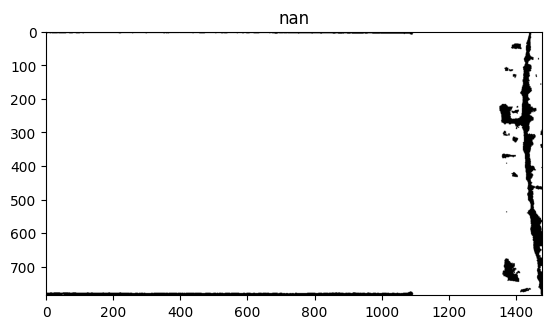

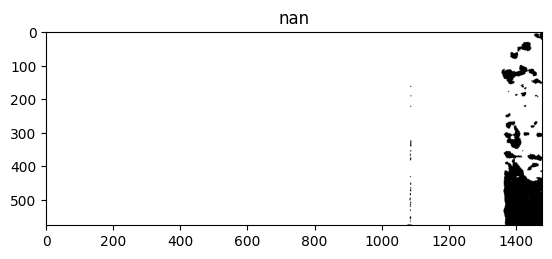

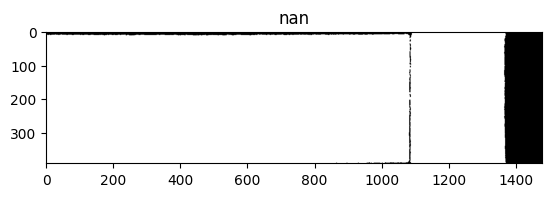

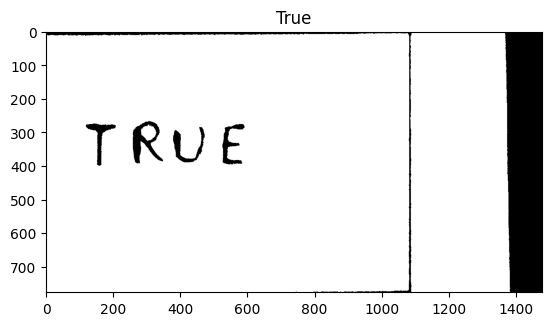

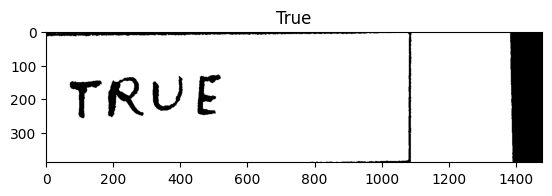

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_154610.jpg
927 394 1069 387
712 999 817 997
947 1586 1103 1581
939 2177 1034 2176
740 2575 1155 2568
708 3166 882 3163
998 3941 1126 3939
1011 4532 1131 4530
952 4922 1084 4919
891 5695 1178 5690
1038 6080 1153 6078


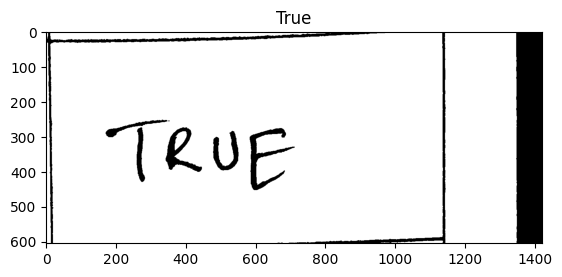

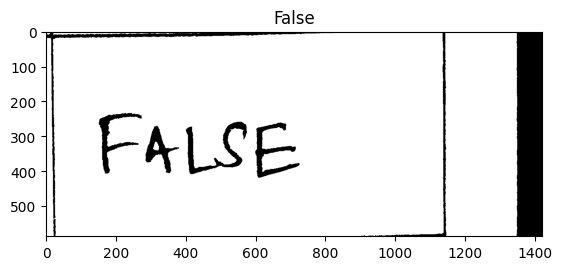

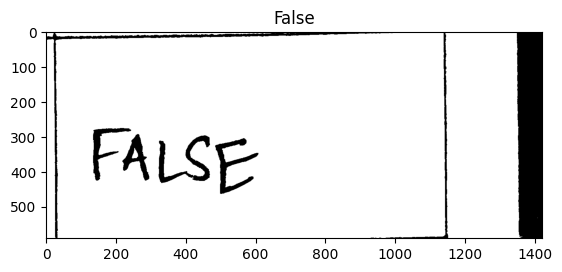

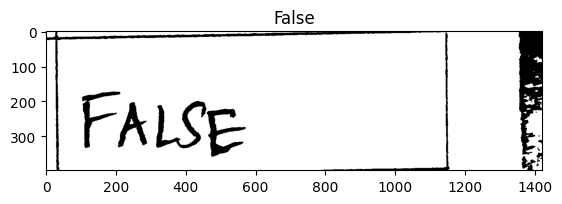

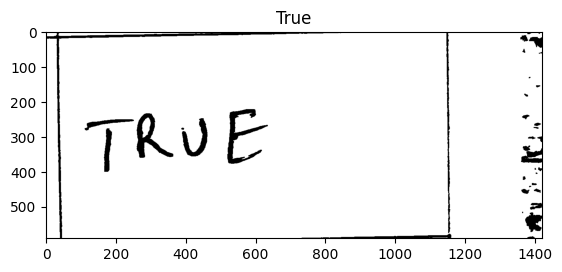

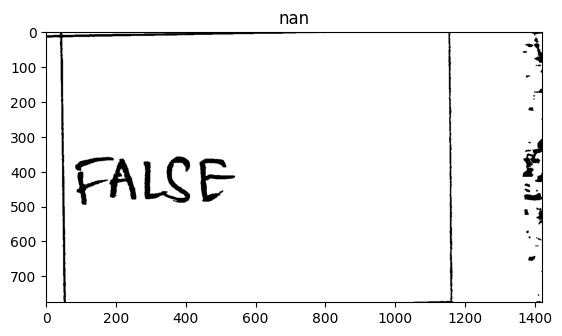

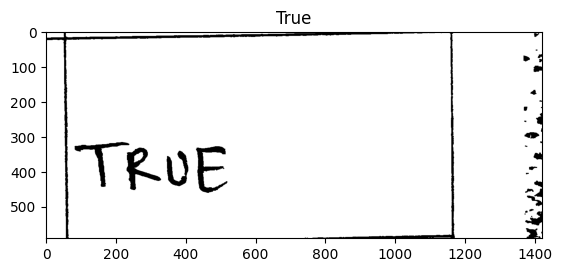

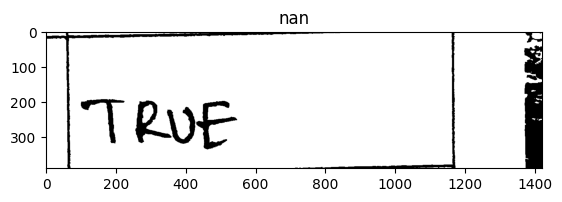

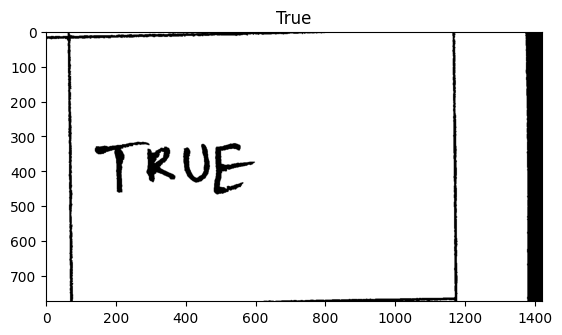

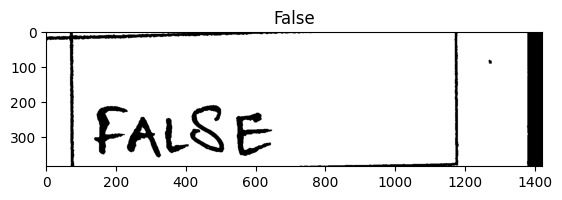

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_152314.jpg
688 354 807 354
929 958 1125 958
883 1564 989 1564
650 2170 759 2170
771 2570 978 2570
892 3168 1116 3168
934 3965 1038 3965
832 4565 929 4565
951 4966 1117 4966
1007 5766 1125 5764
832 6173 989 6171


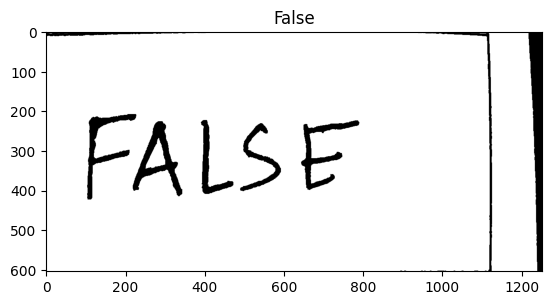

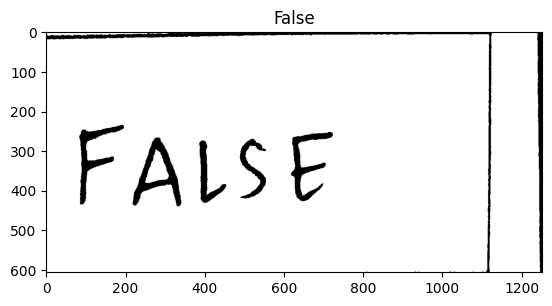

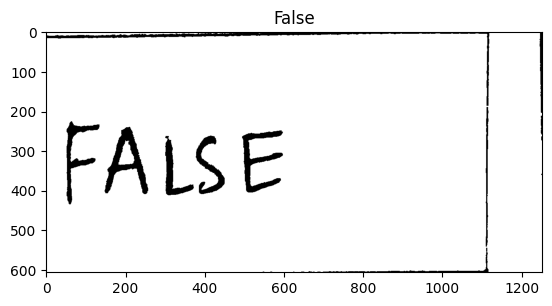

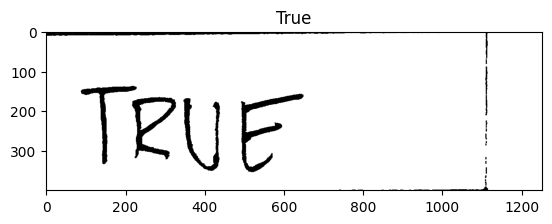

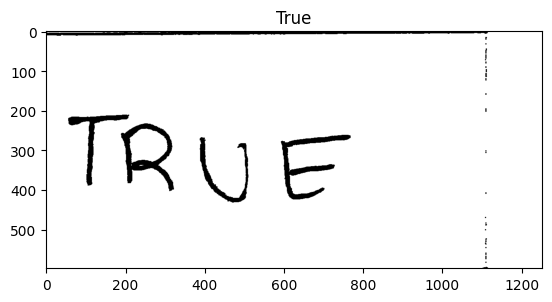

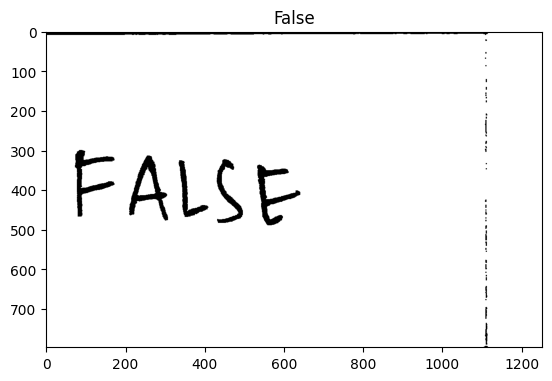

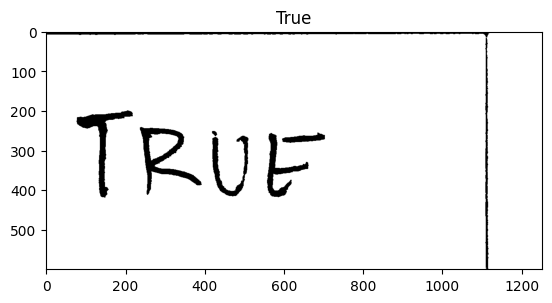

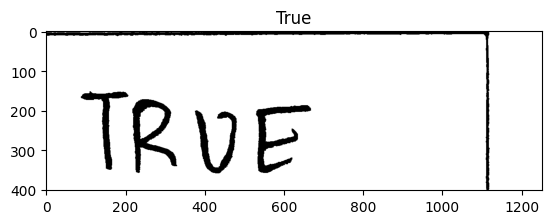

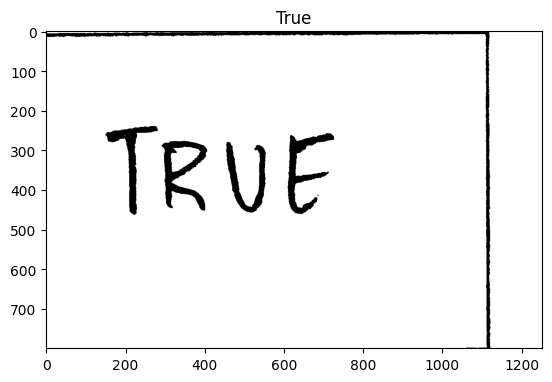

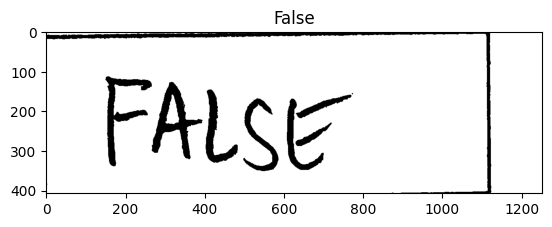

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_153349.jpg
993 328 1086 326
587 950 779 947
630 1559 771 1557
1013 2166 1139 2166
917 2577 1040 2575
1070 3187 1199 3185
1123 3997 1216 3996
706 4615 851 4613
920 5021 1043 5017
822 5835 933 5831
1049 6238 1158 6235


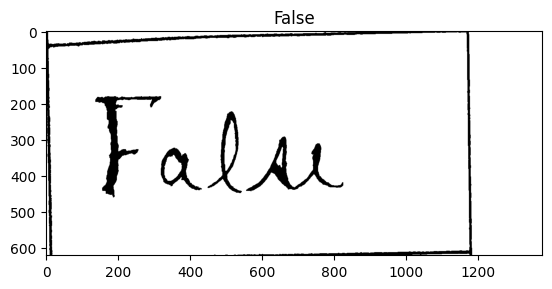

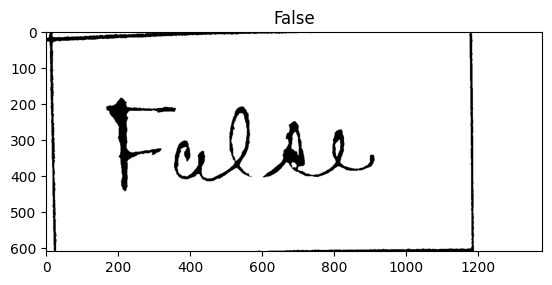

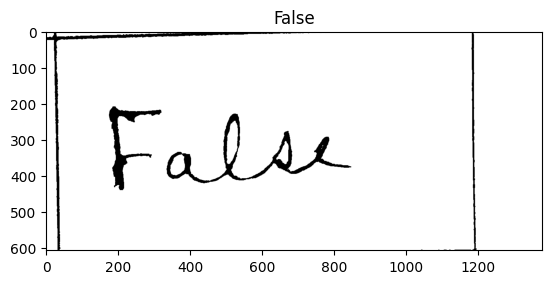

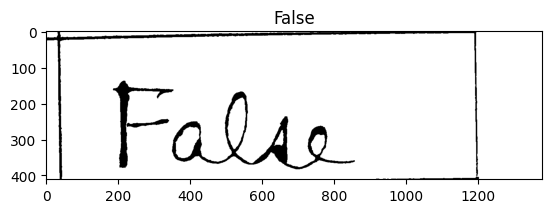

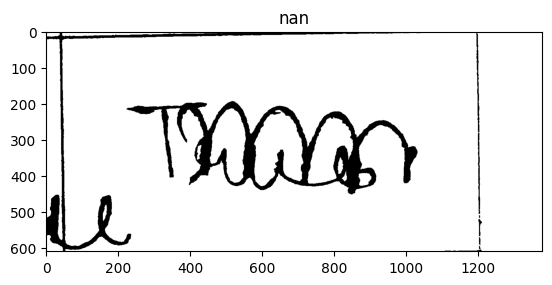

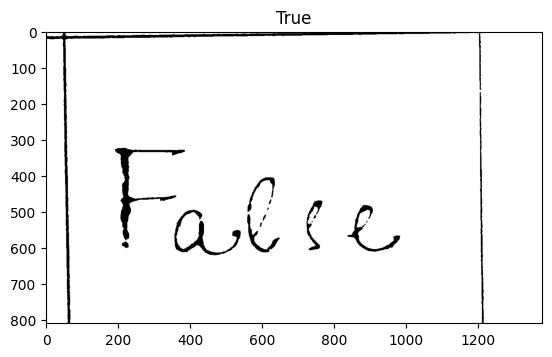

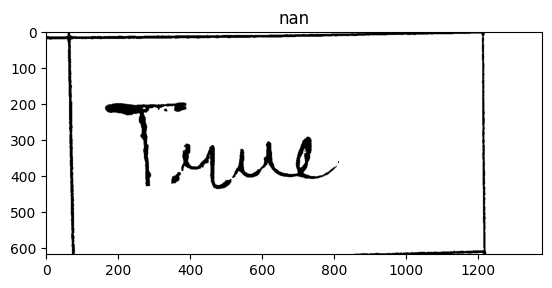

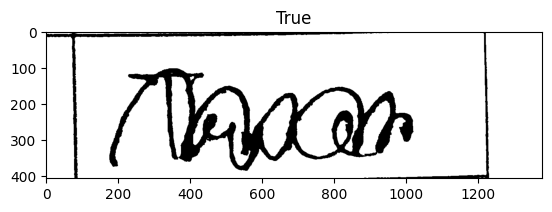

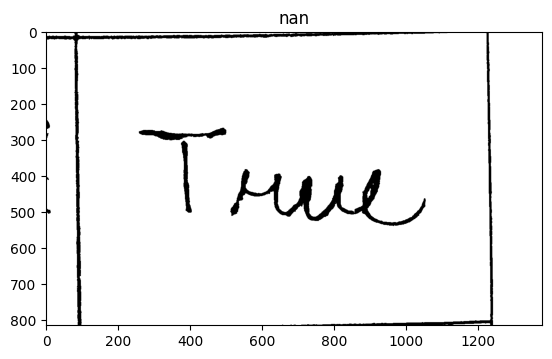

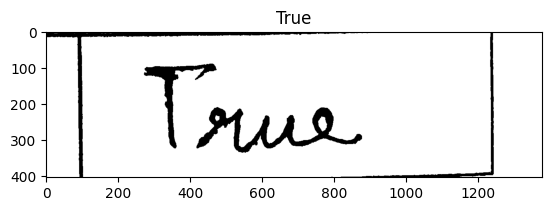

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_153036.jpg
905 339 1006 346
710 869 894 876
505 1418 596 1418
729 1976 826 1976
700 2351 811 2350
821 2914 934 2914
1012 3670 1161 3668
1082 4243 1184 4242
1085 4631 1199 4629
774 5405 926 5405
737 5801 860 5801


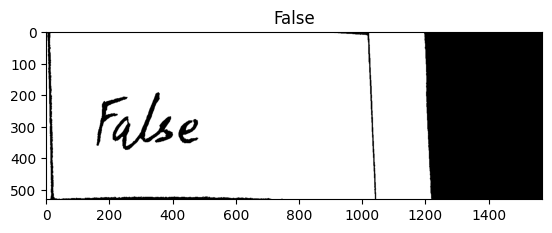

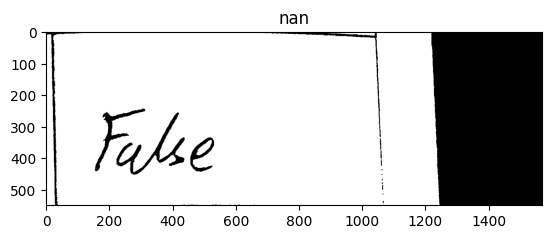

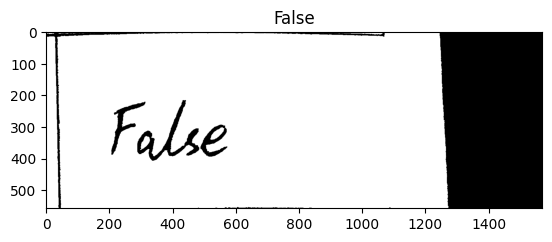

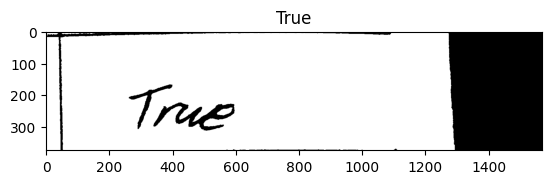

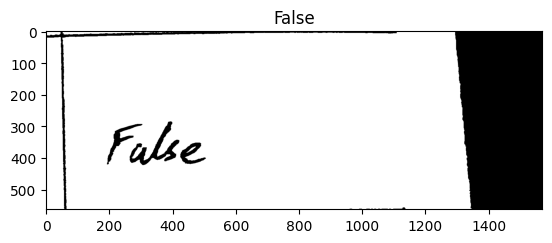

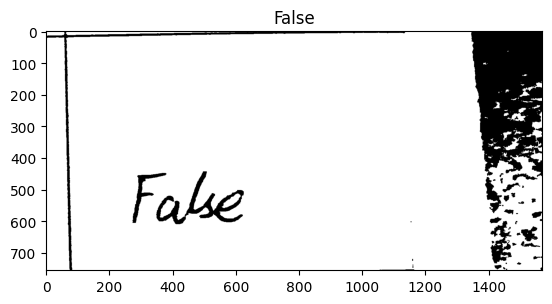

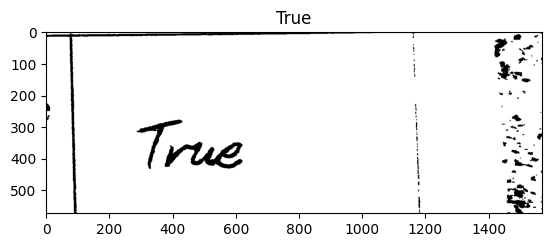

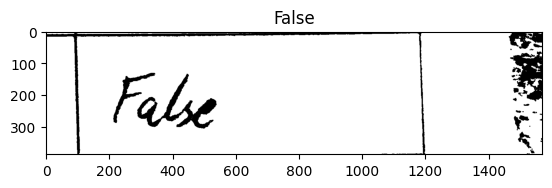

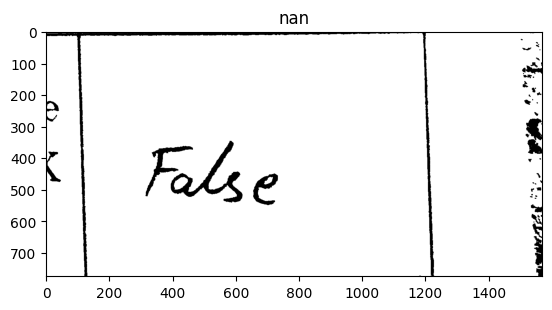

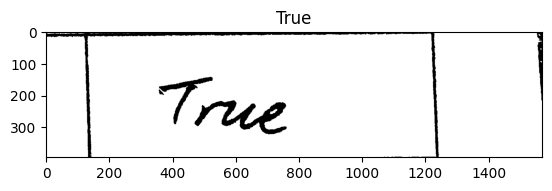

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_152408.jpg
663 468 817 468
689 1068 863 1068
689 1646 789 1646
937 2231 1039 2231
930 2614 1037 2614
634 3202 811 3202
852 3981 992 3981
964 4566 1073 4565
814 4960 904 4958
960 5746 1096 5744
904 6138 1003 6138


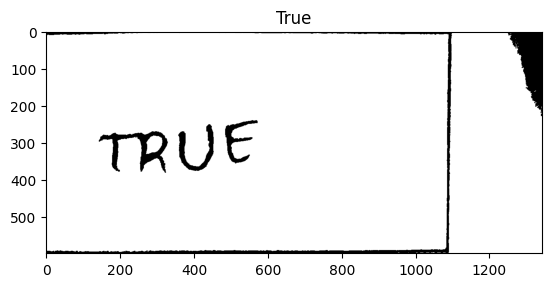

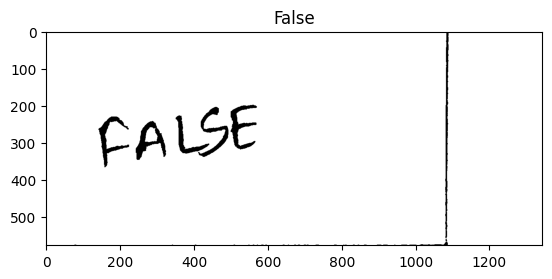

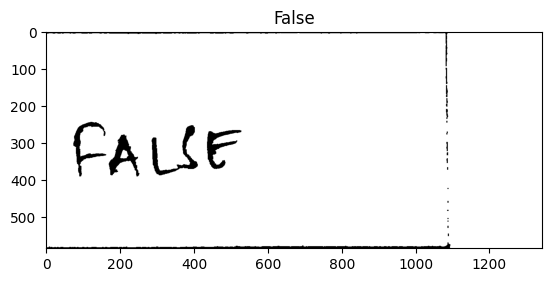

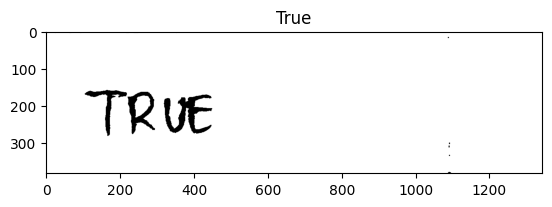

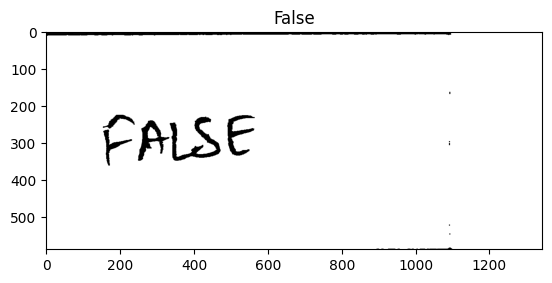

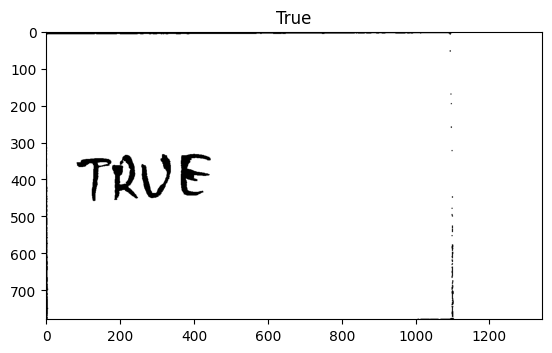

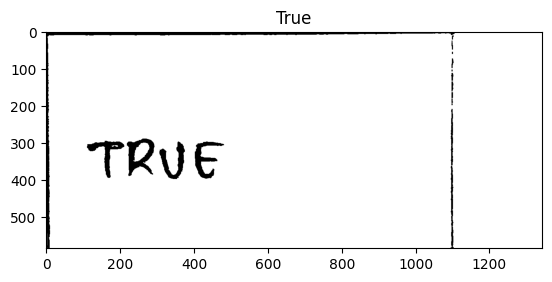

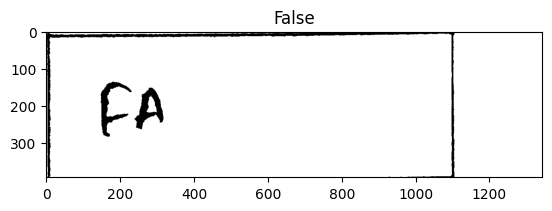

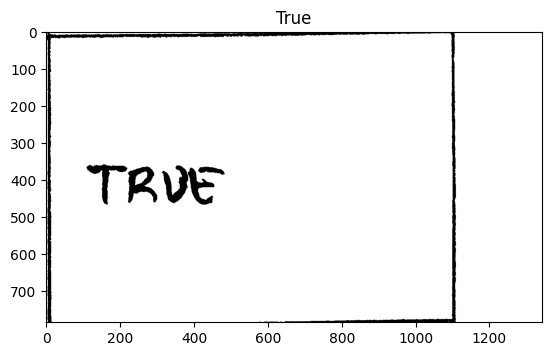

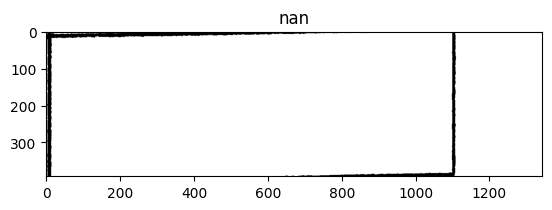

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_153433.jpg
757 278 890 276
884 847 989 842
878 1427 1074 1420
1012 1992 1115 1988
987 2366 1115 2361
909 2933 1114 2926
1057 3683 1186 3679
896 4263 1029 4258
992 4647 1098 4643
1113 5417 1223 5413
1120 5810 1223 5806


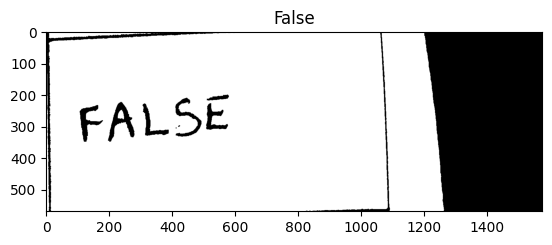

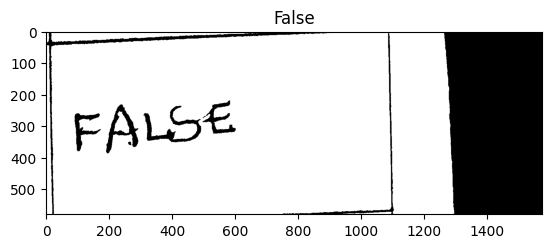

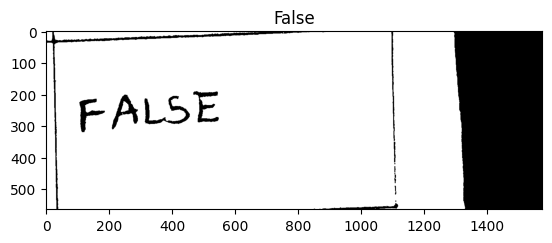

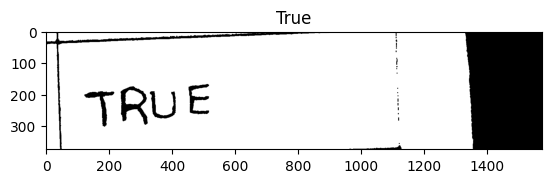

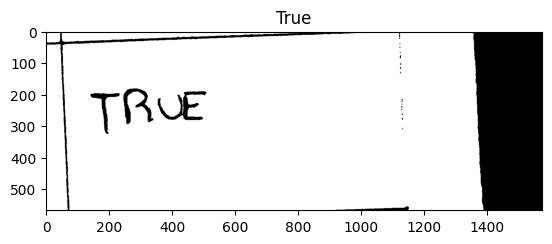

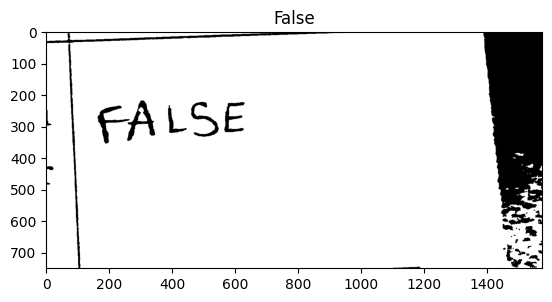

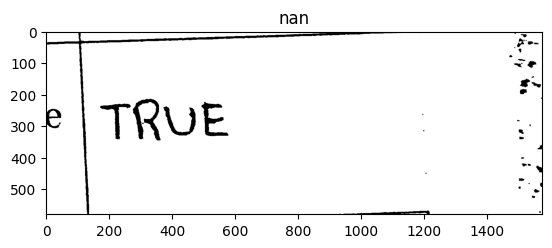

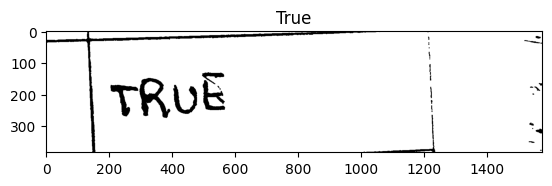

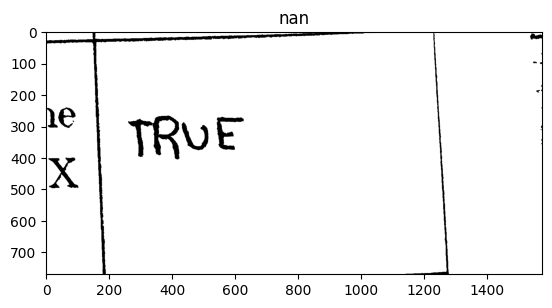

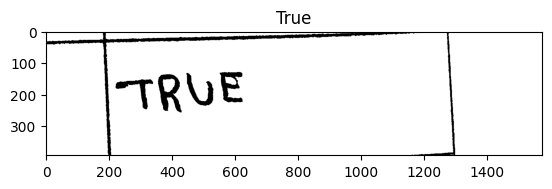

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_151238.jpg
735 322 847 322
933 923 1034 920
1024 1522 1120 1519
551 2133 1008 2118
894 2517 1128 2509
1016 3099 1145 3095
1049 3881 1149 3879
869 4466 962 4465
742 4863 920 4860
816 6062 910 6060


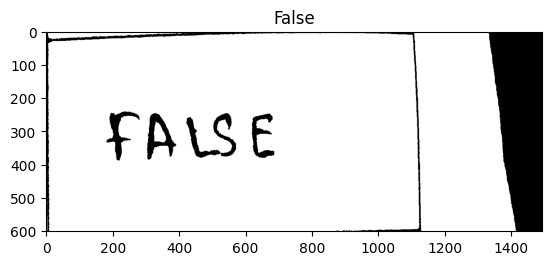

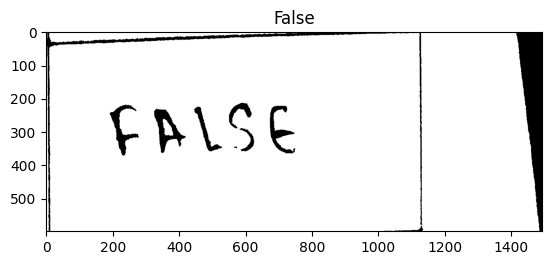

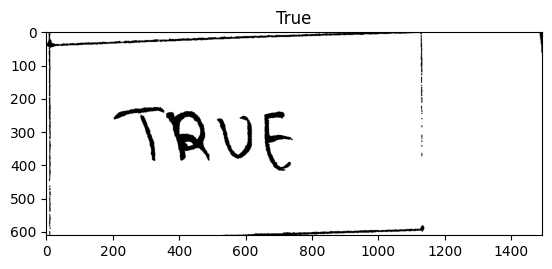

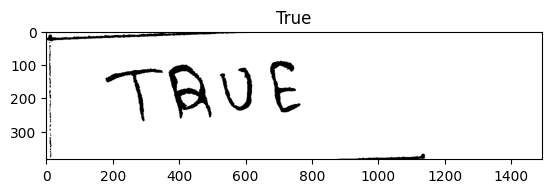

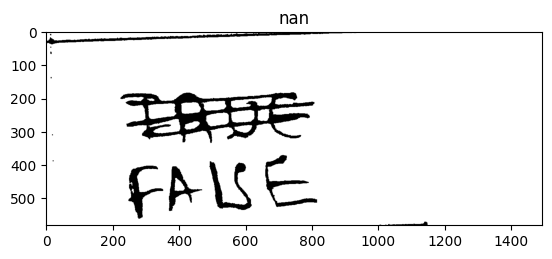

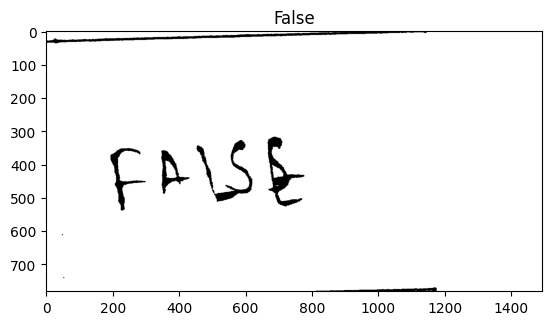

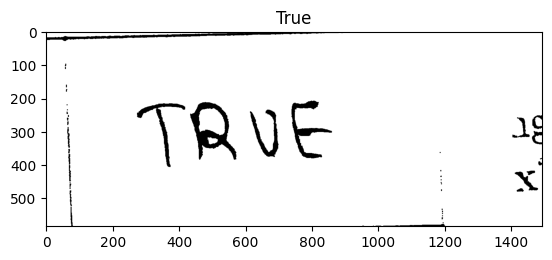

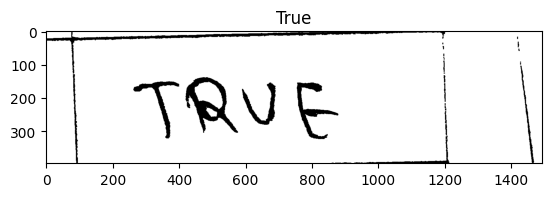

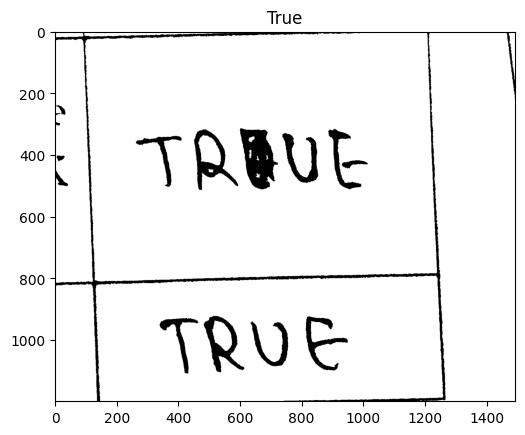

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_151304.jpg
727 380 863 384
857 1006 1076 1002
1013 1644 1145 1642
908 2282 1022 2280
975 2703 1088 2702
855 3335 1025 3333
513 4168 717 4168
837 4792 1036 4792
1080 5210 1196 5210
1032 6048 1170 6046
846 6472 947 6470


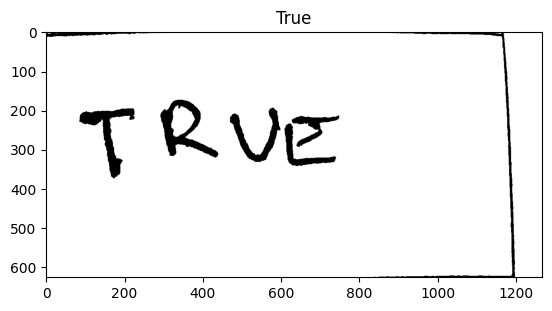

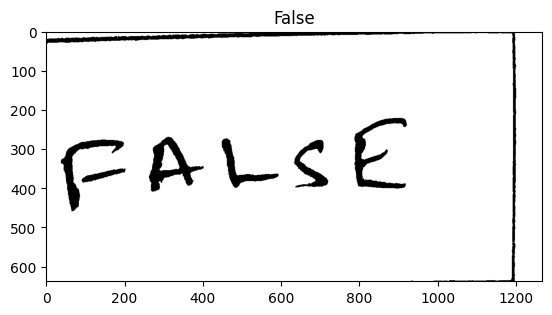

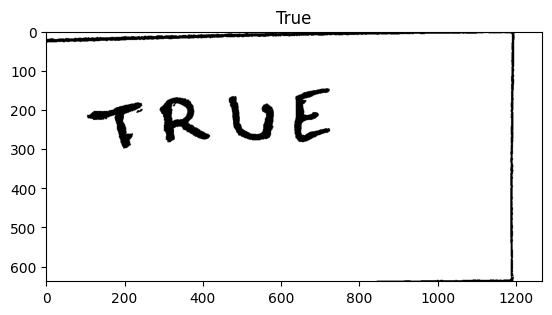

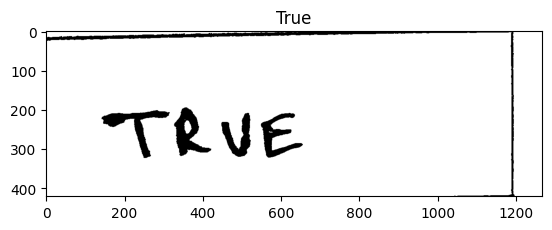

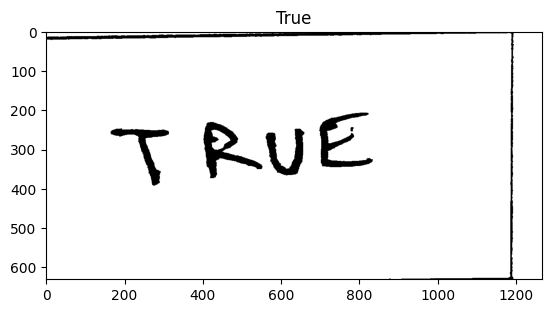

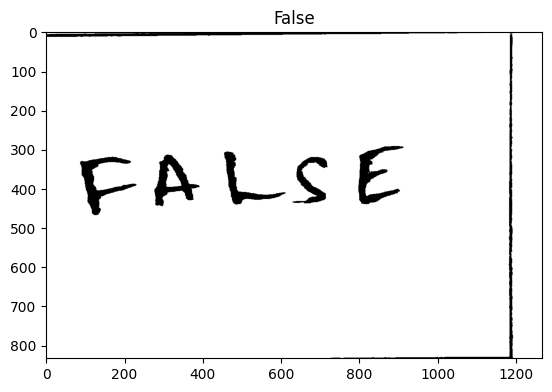

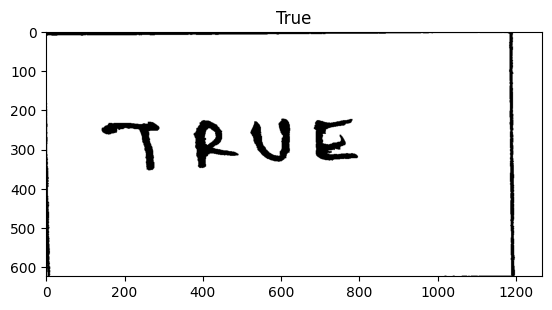

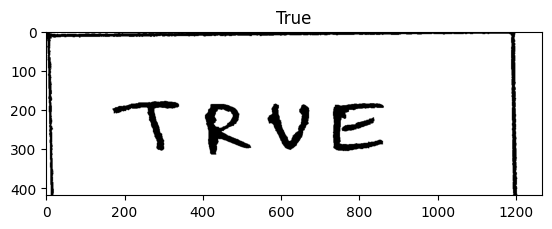

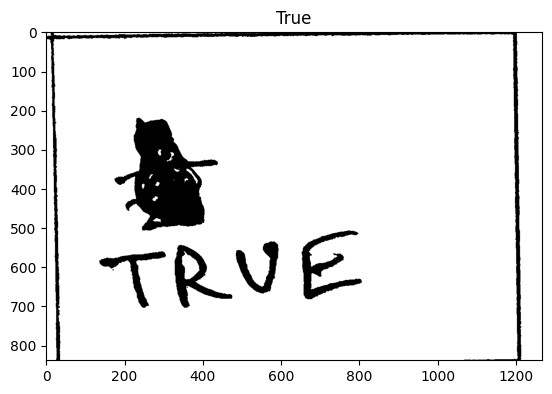

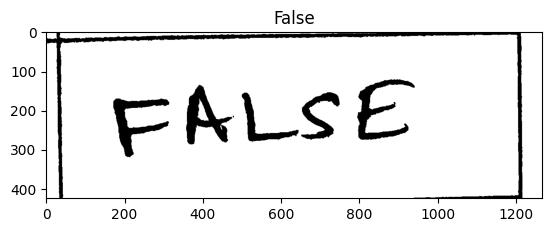

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_155417.jpg
1033 5920 1156 5918
/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_154321.jpg
770 322 869 315
1043 935 1168 928
923 1562 1179 1549
928 2174 1045 2170
1001 2564 1132 2560
1064 3161 1167 3157
1021 3942 1156 3938
1011 4527 1110 4524
699 4927 830 4923
1049 5688 1181 5683
856 6079 949 6075


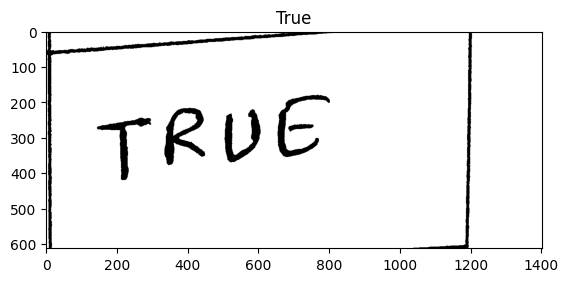

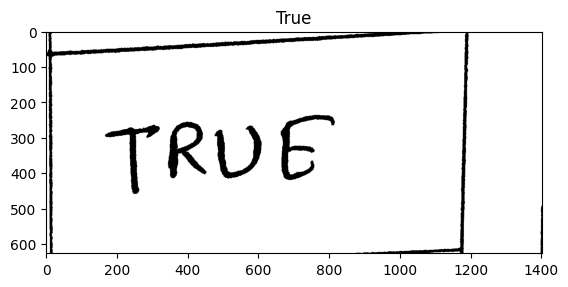

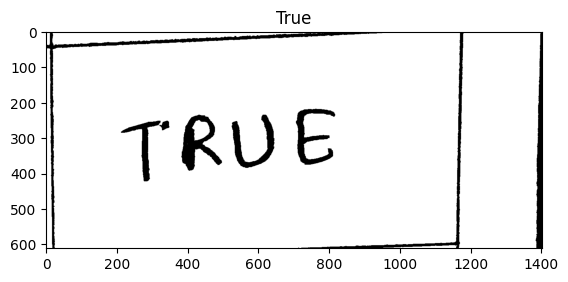

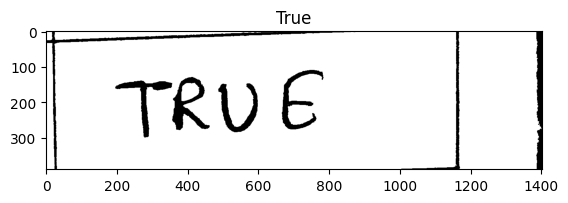

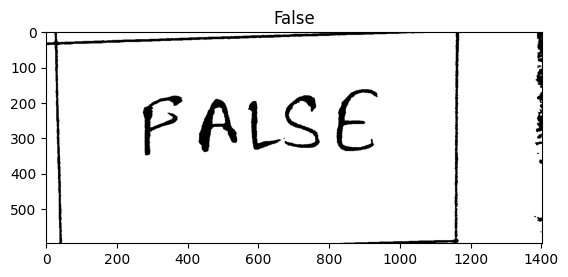

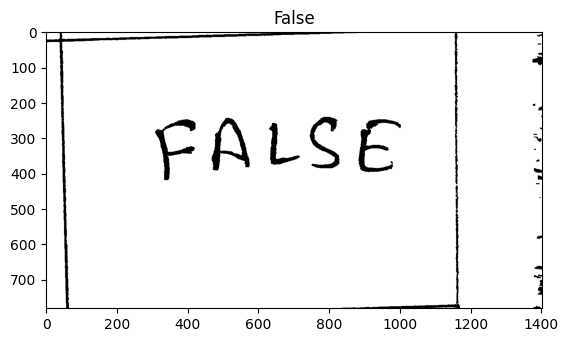

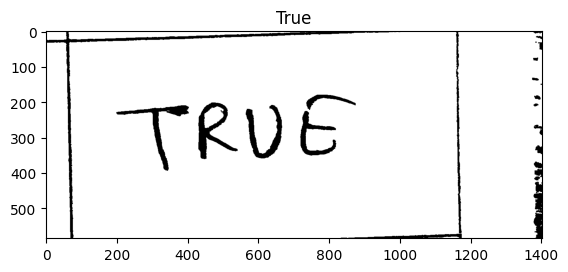

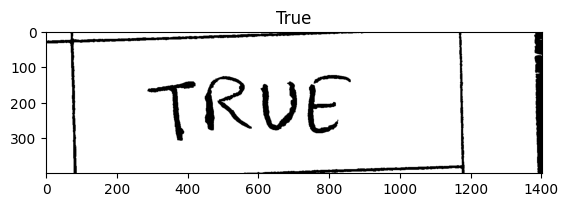

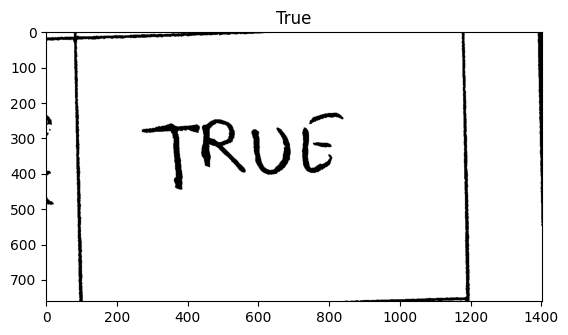

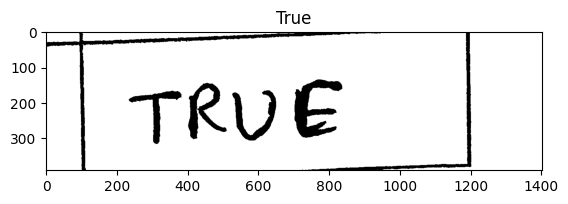

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_145148.jpg
910 411 1018 409
818 1003 936 1001
1026 1598 1118 1597
983 2194 1096 2193
870 2594 1013 2591
985 3189 1098 3188
914 3986 1084 3984
706 4589 841 4589
777 4996 902 4994
1109 5803 1224 5801
1081 6217 1191 6215


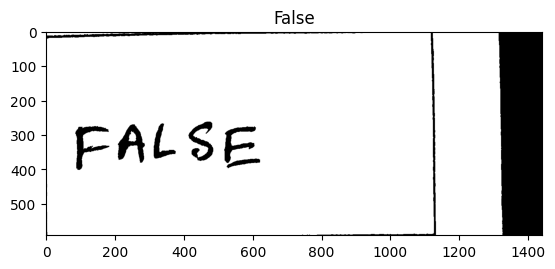

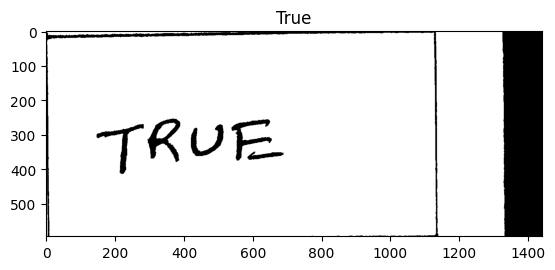

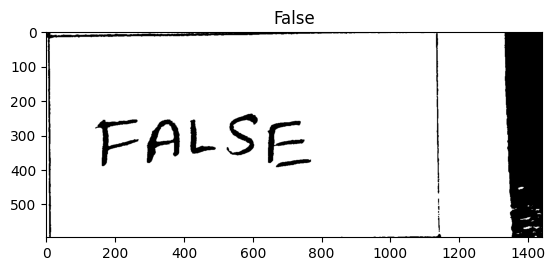

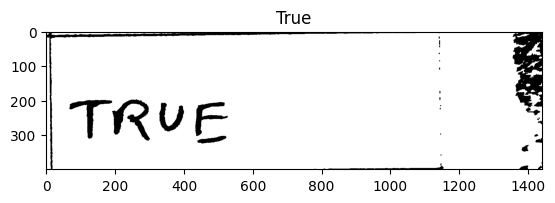

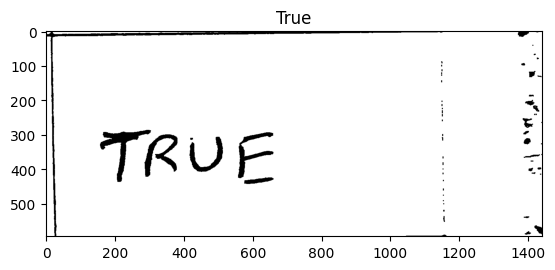

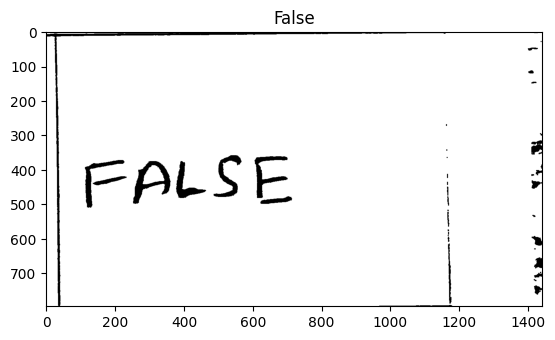

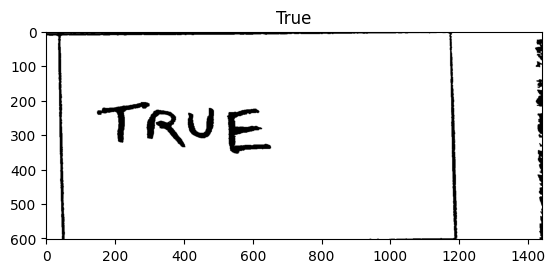

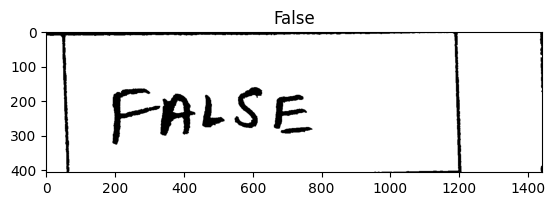

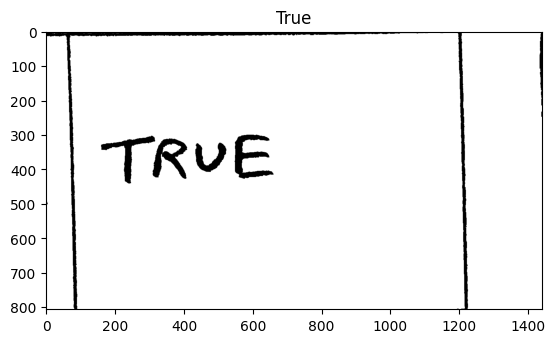

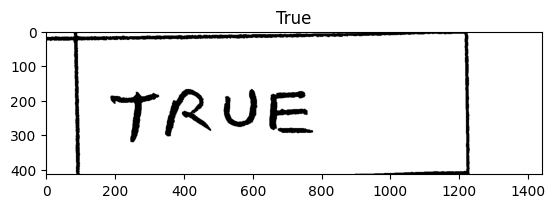

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_154250.jpg
1012 416 1106 414
640 1014 764 1010
841 1601 978 1597
1013 2176 1149 2174
987 2567 1100 2565
1018 3152 1133 3150
710 3943 808 3940
1022 4531 1181 4526
950 4931 1041 4928
961 5724 1073 5720
1091 6110 1190 6105


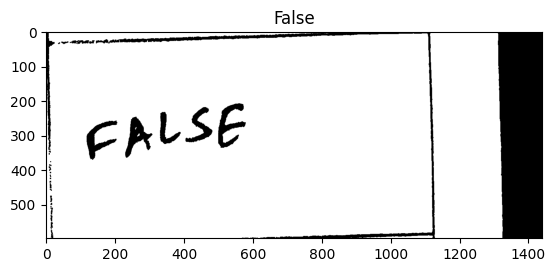

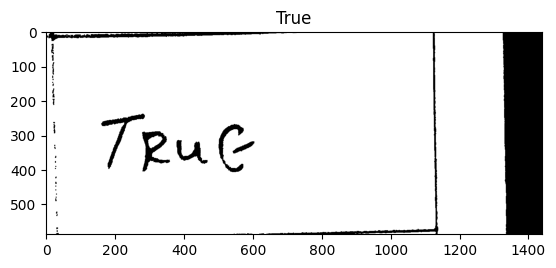

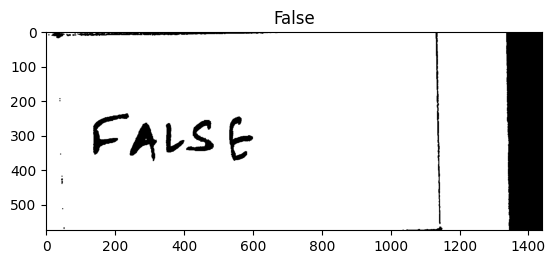

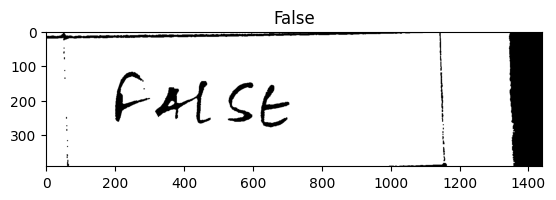

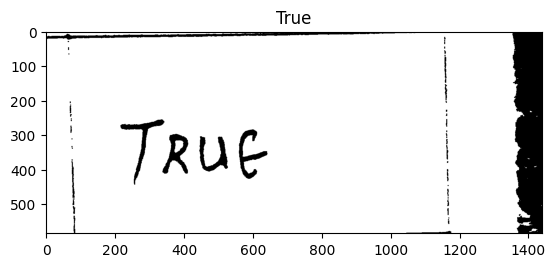

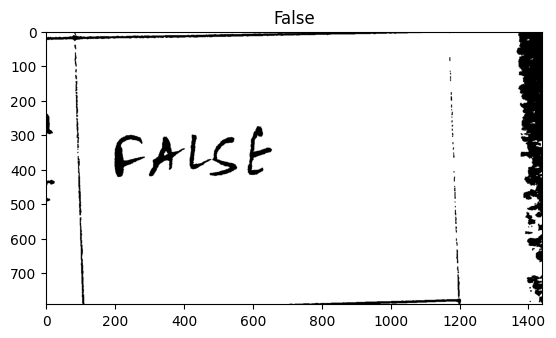

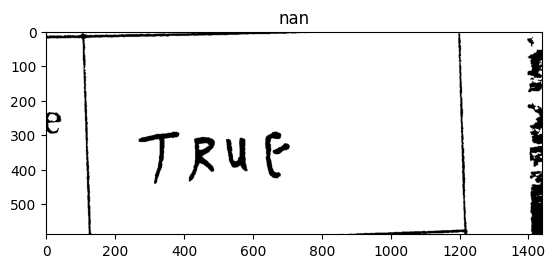

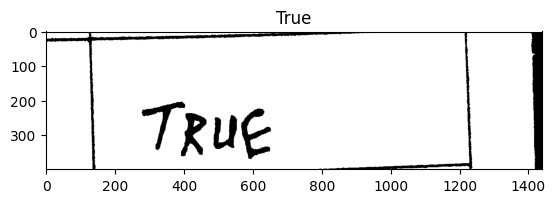

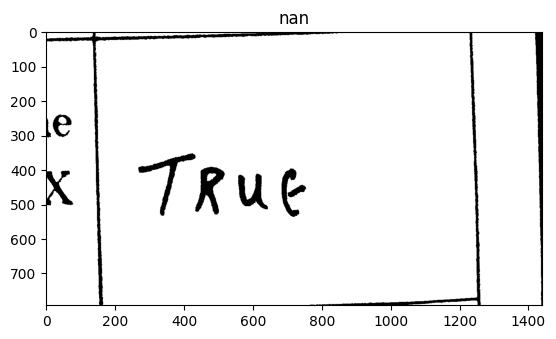

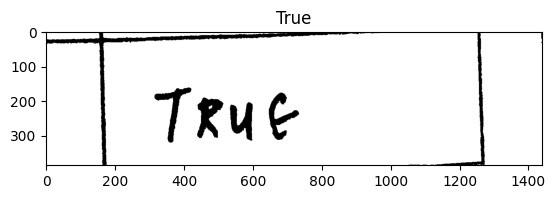

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_155818.jpg
1052 370 1148 370
1027 994 1168 992
1012 1613 1126 1611
919 2222 1036 2218
910 2628 1153 2624
966 3232 1058 3231
1019 4031 1133 4031
933 4631 1024 4631
854 5033 1001 5033
942 5836 1121 5833
1023 6245 1118 6244


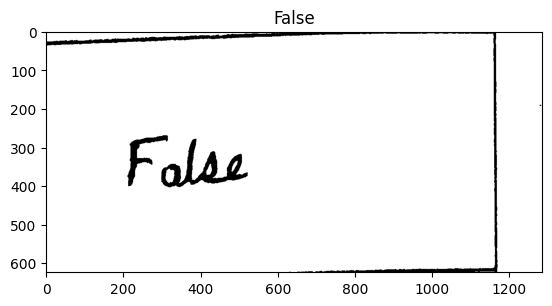

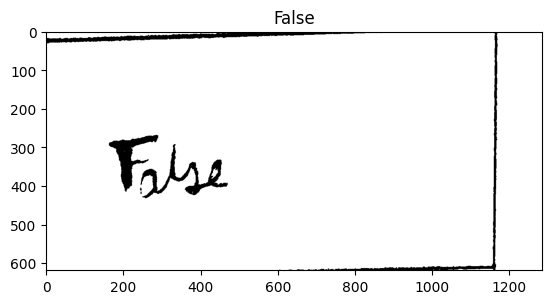

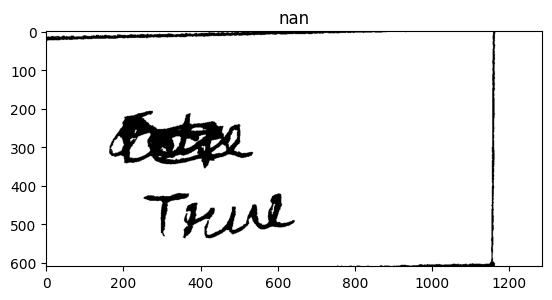

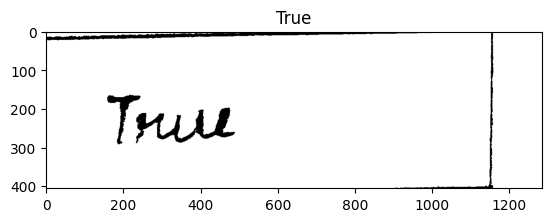

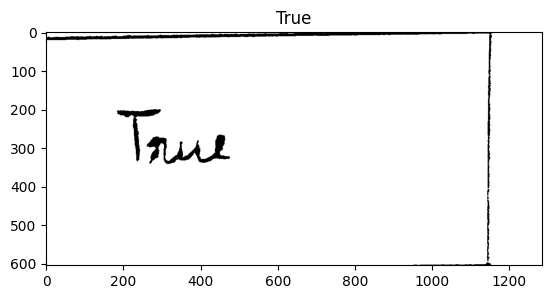

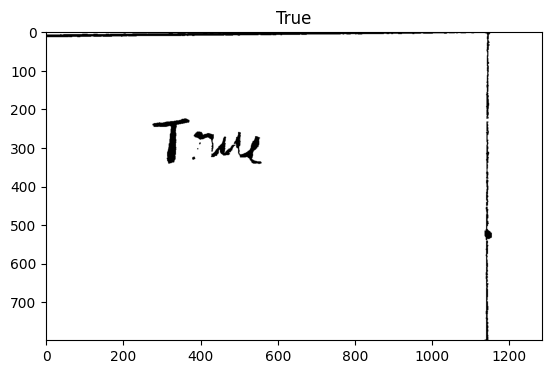

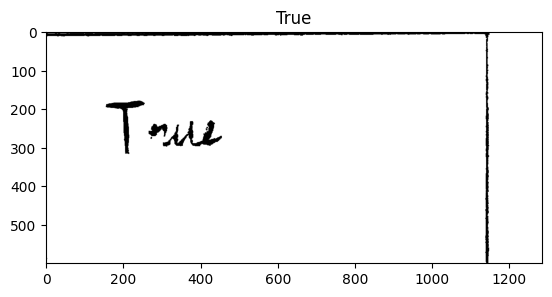

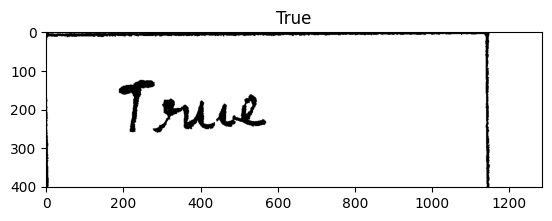

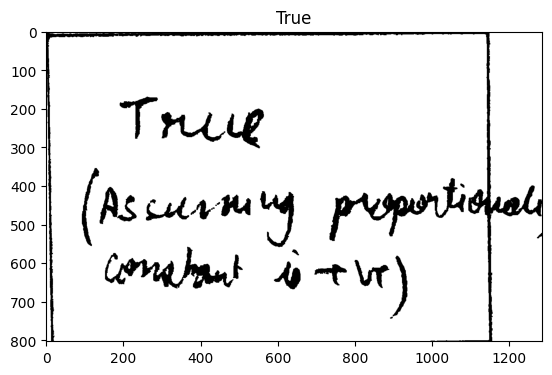

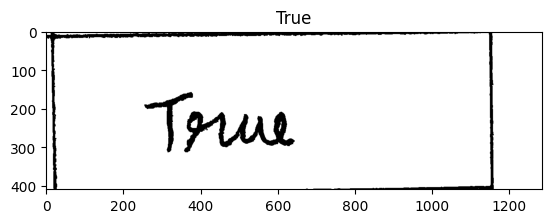

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_153338.jpg
914 243 1011 238
910 863 1023 857
865 1480 963 1476
854 2091 971 2085
1110 2487 1206 2484
863 3097 970 3094
802 3899 1067 3890
882 4496 984 4493
1161 4892 1256 4889
1120 5689 1268 5683
918 6086 1010 6083


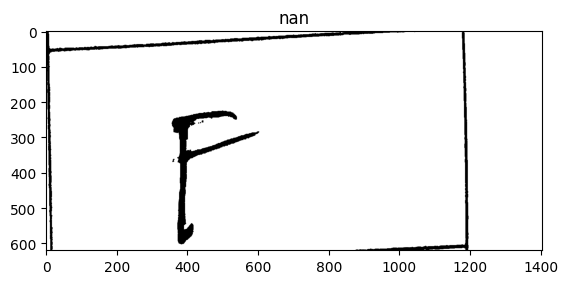

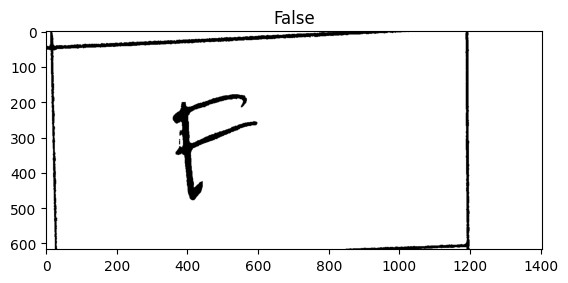

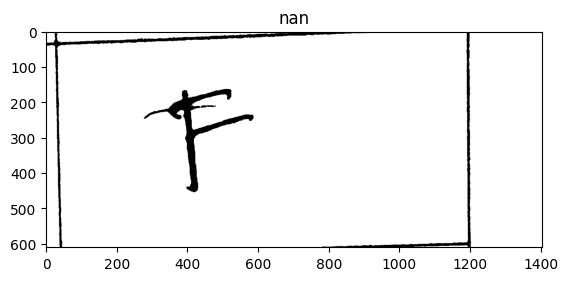

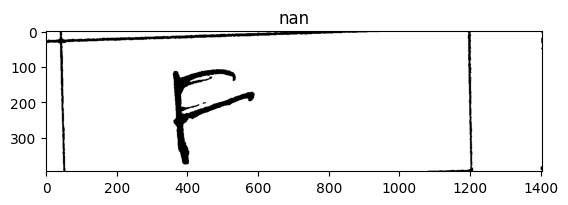

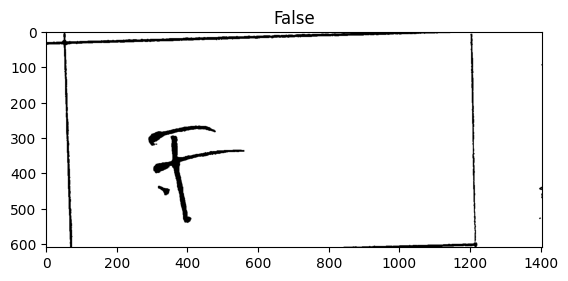

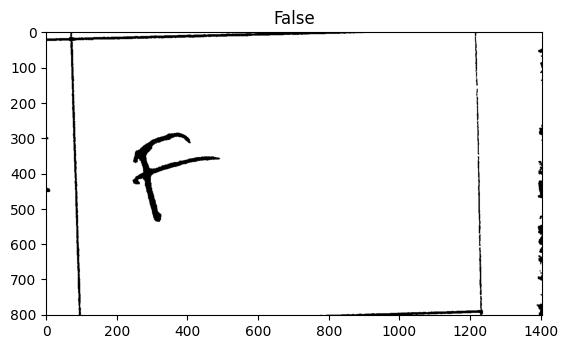

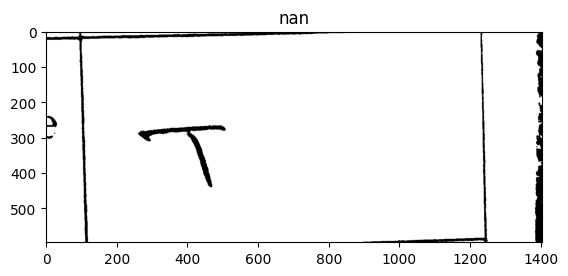

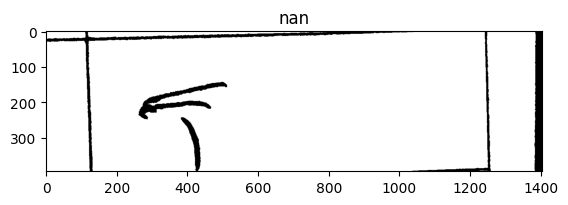

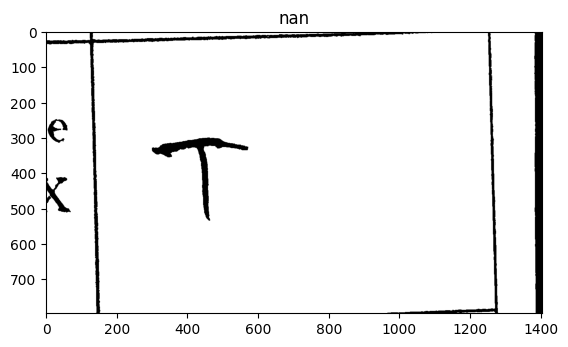

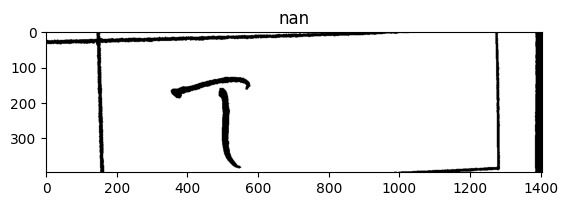

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_153316.jpg
975 315 1065 311
874 942 1048 936
652 1574 783 1567
1007 2161 1136 2157
938 2568 1028 2567
951 3148 1096 3146
996 3921 1096 3921
512 4504 616 4502
788 4891 878 4891
958 5667 1069 5667
734 6061 830 6060


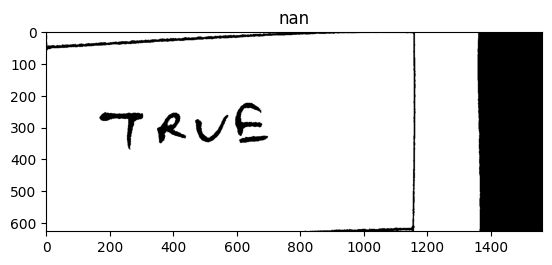

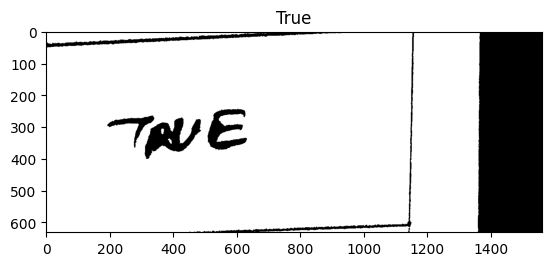

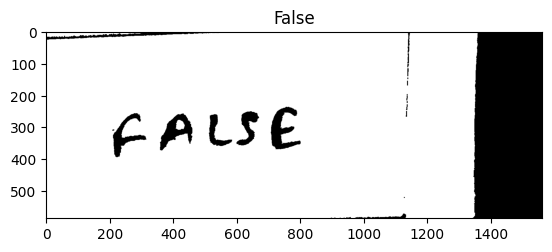

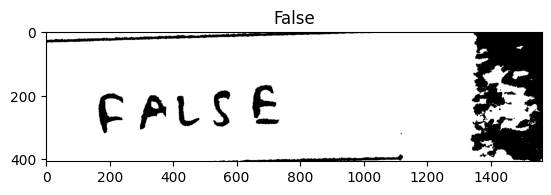

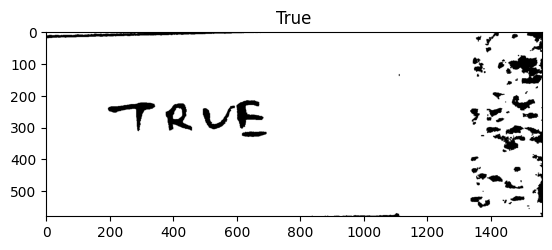

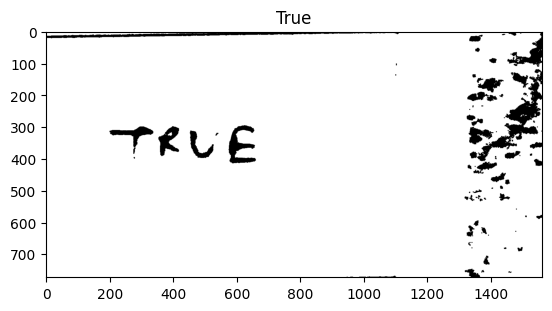

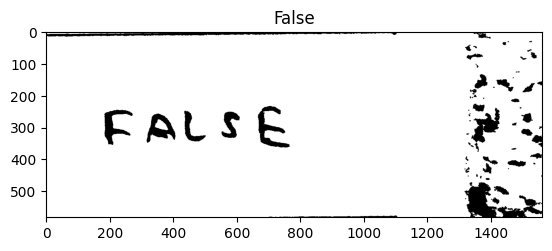

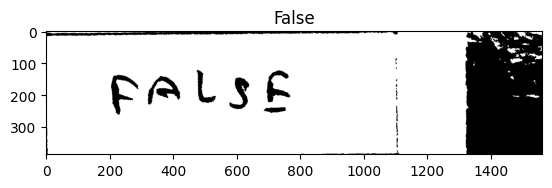

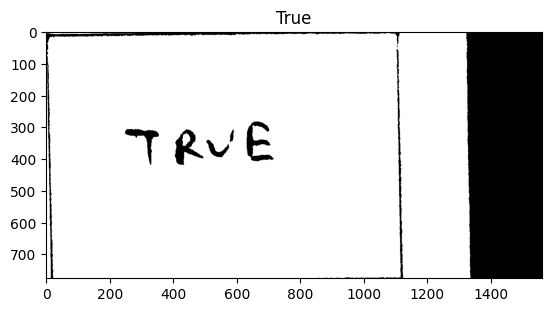

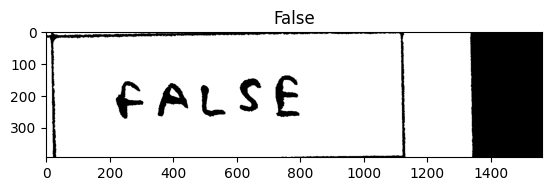

/content/drive/MyDrive/anand_mishra/Train_Samples_V0/20240328_150636.jpg
1075 361 1173 357
1000 1000 1100 998
1019 1614 1114 1613
765 2213 882 2211
992 2617 1087 2617
621 3202 755 3202
776 3973 871 3972
835 4555 925 4554
966 4942 1060 4941
698 5718 800 5716
909 6107 1002 6103


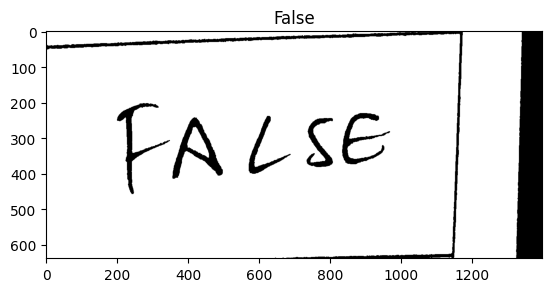

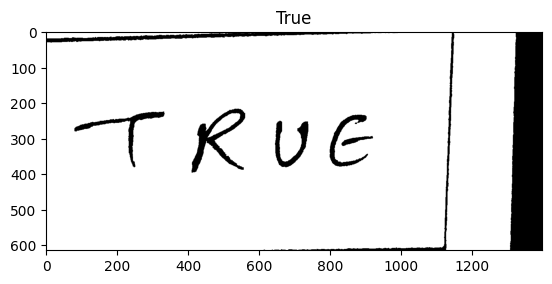

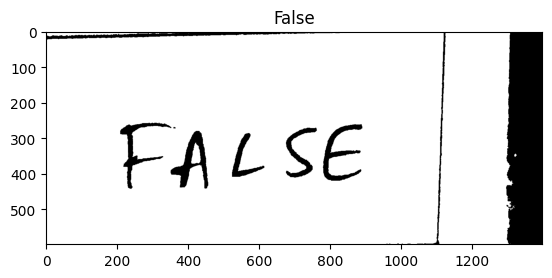

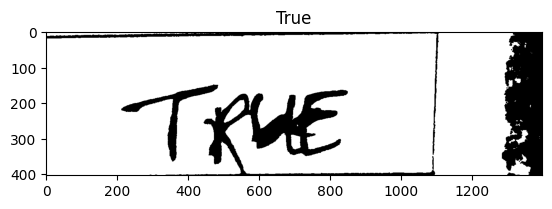

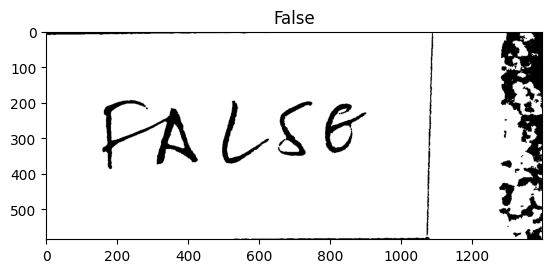

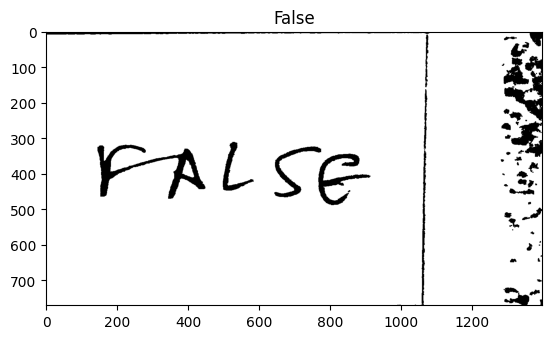

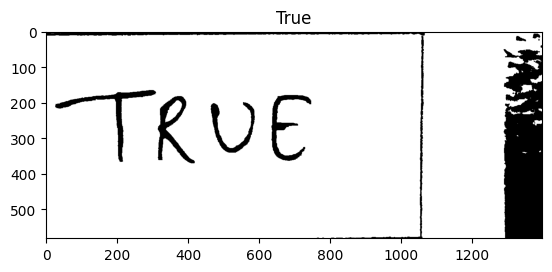

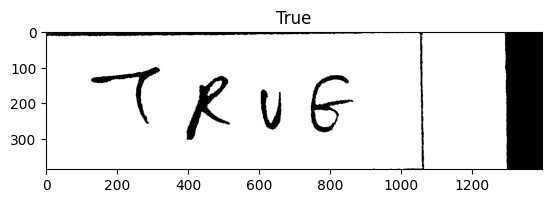

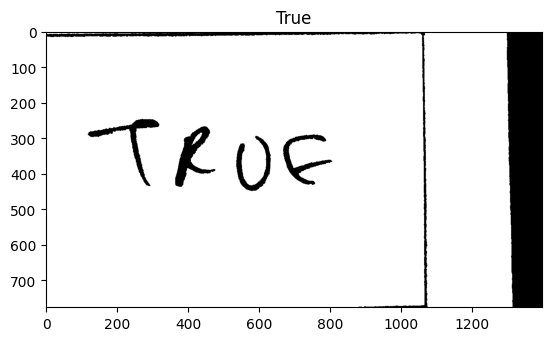

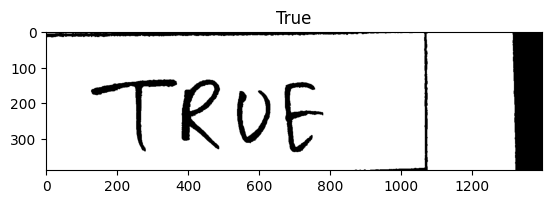

In [77]:
answers=[]
for path in arr:
    print(path)
    images,texts=get_cropped_images(path)
    answers.append(texts)

In [78]:
import pandas as pd
df=pd.DataFrame(answers)
df

,0,1,2,3,4,5,6,7,8,9
0,True,True,True,True,True,False,True,True,False,True
1,True,True,False,True,False,False,True,nan,True,True
2,nan,True,nan,True,True,True,nan,False,nan,None
3,True,False,True,True,True,False,True,True,True,True
4,True,True,False,False,True,nan,True,nan,True,True
5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
6,False,False,True,False,True,False,False,True,False,True
7,False,False,nan,True,nan,True,True,True,True,None
8,True,True,False,nan,True,nan,False,None,None,None
9,True,True,False,False,True,nan,True,True,False,False


In [80]:
marks=pd.read_csv("/content/drive/MyDrive/anand_mishra/Marks.csv")
answer=pd.read_csv("/content/drive/MyDrive/anand_mishra/ModelAnswer.csv")
marks

,Filename,Total Marks
0,20240328_153316.jpg,3
1,20240328_151033.jpg,4
2,20240328_152349.jpg,4
3,20240328_145247.jpg,5
4,20240328_150204.jpg,5
5,20240328_151020.jpg,5
6,20240328_151304.jpg,5
7,20240328_152408.jpg,5
8,20240328_145148.jpg,6
9,20240328_145719.jpg,6


In [83]:
correct=answer['Correct Answer']
correct

0    False
1    False
2    False
3    False
4    False
5    False
6     True
7     True
8     True
9     True
Name: Correct Answer, dtype: bool

In [92]:
df.drop('marks',axis=1,inplace=True)

In [97]:
df.replace(np.nan,"nan",inplace=True)
df

,0,1,2,3,4,5,6,7,8,9
0,True,True,True,True,True,False,True,True,False,True
1,True,True,False,True,False,False,True,nan,True,True
2,nan,True,nan,True,True,True,nan,False,nan,nan
3,True,False,True,True,True,False,True,True,True,True
4,True,True,False,False,True,nan,True,nan,True,True
5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
6,False,False,True,False,True,False,False,True,False,True
7,False,False,nan,True,nan,True,True,True,True,nan
8,True,True,False,nan,True,nan,False,nan,nan,nan
9,True,True,False,False,True,nan,True,True,False,False


In [98]:
def cal_marks(a1,a2):
    ans=0
    for i in range(len(a1)):

        if(a1[i]!="nan"):
            temp=eval(a1[i])
        else:
            temp=a1[i]
        if(temp==a2[i]):
            ans+=1
    return ans
marks1=[]
for i in range(len(df)):
    marks1.append(cal_marks(df.iloc[i],correct))
df['marks']=marks1
df

,0,1,2,3,4,5,6,7,8,9,marks
0,True,True,True,True,True,False,True,True,False,True,4
1,True,True,False,True,False,False,True,nan,True,True,6
2,nan,True,nan,True,True,True,nan,False,nan,nan,0
3,True,False,True,True,True,False,True,True,True,True,6
4,True,True,False,False,True,nan,True,nan,True,True,5
5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0
6,False,False,True,False,True,False,False,True,False,True,6
7,False,False,nan,True,nan,True,True,True,True,nan,5
8,True,True,False,nan,True,nan,False,nan,nan,nan,1
9,True,True,False,False,True,nan,True,True,False,False,4


In [100]:
names=[i.split('/')[-1] for i in arr]
names

['20240328_152349.jpg',
 '20240328_155745.jpg',
 '20240328_150204.jpg',
 '20240328_145719.jpg',
 '20240328_153456.jpg',
 '20240328_145247.jpg',
 '20240328_154830.jpg',
 '20240328_153543.jpg',
 '20240328_150931.jpg',
 '20240328_151020.jpg',
 '20240328_154601.jpg',
 '20240328_151033.jpg',
 '20240328_154610.jpg',
 '20240328_152314.jpg',
 '20240328_153349.jpg',
 '20240328_153036.jpg',
 '20240328_152408.jpg',
 '20240328_153433.jpg',
 '20240328_151238.jpg',
 '20240328_151304.jpg',
 '20240328_155417.jpg',
 '20240328_154321.jpg',
 '20240328_145148.jpg',
 '20240328_154250.jpg',
 '20240328_155818.jpg',
 '20240328_153338.jpg',
 '20240328_153316.jpg',
 '20240328_150636.jpg']

In [108]:
marks[marks['Filename']=='20240328_150636.jpg']['Total Marks'].values[0]

8

In [110]:
real_marks=[marks[marks['Filename']==i]['Total Marks'].values[0] for i in names]
real_marks

[4,
 6,
 5,
 6,
 7,
 5,
 7,
 9,
 6,
 5,
 7,
 4,
 7,
 7,
 9,
 7,
 5,
 8,
 8,
 5,
 7,
 6,
 6,
 8,
 6,
 10,
 3,
 8]

In [112]:
pred_marks=df['marks']

In [ ]:
from sklearn.metrics import acc